<font face="verdana"> 
 ### Cluster analysis Loan status
    
In this analysis we will,

1. use T-sne (dimension reduction) to build T-sne dataset for our dataset. Plot multi dimension data in 2D using Tsne.
2. Analyze each attribute as how it has clustered.
3. make observations

In [110]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#%matplotlib inline
import warnings
warnings.simplefilter('ignore',DeprecationWarning)
import seaborn as sns
import time
import copy
from datetime import datetime
from time import strftime


from pylab import rcParams
#import hdbscan

from sklearn.model_selection import ShuffleSplit
from sklearn.preprocessing import StandardScaler

#from sklearn.datasets import make_blobs

from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_score

from sklearn import metrics
from sklearn import metrics as mt
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score as acc
from sklearn.metrics import confusion_matrix as conf
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_fscore_support as score

from sklearn.cluster import KMeans

from tabulate import tabulate

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from __future__ import print_function

## Master data import and clean up.

In [111]:
df = pd.read_csv('cluster_clean_data.csv')
df.columns

Index(['id', 'loan_amnt', 'term', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'loan_status', 'purpose', 'addr_state', 'dti',
       'delinq_2yrs', 'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'pub_rec_bankruptcies', 'n_term'],
      dtype='object')

In [112]:
df.head()

,id,loan_amnt,term,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,...,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,n_term
0,1,5000,36 months,10+ years,RENT,24000.0,Verified,Approved,credit_card,AZ,...,1.0,0.0,0.0,3.0,0.0,13648,83.7,9.0,0.0,36
1,2,2500,60 months,< 1 year,RENT,30000.0,Source Verified,Declined,car,GA,...,5.0,0.0,0.0,3.0,0.0,1687,9.4,4.0,0.0,60
2,3,2400,36 months,10+ years,RENT,12252.0,Not Verified,Approved,small_business,IL,...,2.0,0.0,0.0,2.0,0.0,2956,98.5,10.0,0.0,36
3,4,10000,36 months,10+ years,RENT,49200.0,Source Verified,Approved,other,CA,...,1.0,35.0,0.0,10.0,0.0,5598,21.0,37.0,0.0,36
4,5,3000,60 months,1 year,RENT,80000.0,Source Verified,Approved,other,OR,...,0.0,38.0,0.0,15.0,0.0,27783,53.9,38.0,0.0,60


### clean up copy of master data and prepare for tsne

In [113]:
# set required variables for model comparison

tsne_tbl = pd.DataFrame(columns = [
    'model_name',
    'perplexity',
    'kl_divergence',
    'process_time'])

i_index = []
i_index = 0

# preparation for cross validation and model comparison, each classifier is appended once model is fit

models = []

df_cluster = copy.deepcopy(df)


### Create copy of master as df_cluster to store x-tsne, y-tsne values, and flattenout categorical variables

In [26]:
df_cluster.head()

,id,loan_amnt,term,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,...,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,n_term
0,1,5000,36 months,10+ years,RENT,24000.0,Verified,Approved,credit_card,AZ,...,1.0,0.0,0.0,3.0,0.0,13648,83.7,9.0,0.0,36
1,2,2500,60 months,< 1 year,RENT,30000.0,Source Verified,Declined,car,GA,...,5.0,0.0,0.0,3.0,0.0,1687,9.4,4.0,0.0,60
2,3,2400,36 months,10+ years,RENT,12252.0,Not Verified,Approved,small_business,IL,...,2.0,0.0,0.0,2.0,0.0,2956,98.5,10.0,0.0,36
3,4,10000,36 months,10+ years,RENT,49200.0,Source Verified,Approved,other,CA,...,1.0,35.0,0.0,10.0,0.0,5598,21.0,37.0,0.0,36
4,5,3000,60 months,1 year,RENT,80000.0,Source Verified,Approved,other,OR,...,0.0,38.0,0.0,15.0,0.0,27783,53.9,38.0,0.0,60


In [27]:
df_cluster.set_index('id')

,loan_amnt,term,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,dti,...,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,n_term
id,,,,,,,,,,,,,,,,,,,,,
1,5000,36 months,10+ years,RENT,24000.00000,Verified,Approved,credit_card,AZ,27.65,...,1.0,0.0,0.0,3.0,0.0,13648,83.700000,9.0,0.0,36
2,2500,60 months,< 1 year,RENT,30000.00000,Source Verified,Declined,car,GA,1.00,...,5.0,0.0,0.0,3.0,0.0,1687,9.400000,4.0,0.0,60
3,2400,36 months,10+ years,RENT,12252.00000,Not Verified,Approved,small_business,IL,8.72,...,2.0,0.0,0.0,2.0,0.0,2956,98.500000,10.0,0.0,36
4,10000,36 months,10+ years,RENT,49200.00000,Source Verified,Approved,other,CA,20.00,...,1.0,35.0,0.0,10.0,0.0,5598,21.000000,37.0,0.0,36
5,3000,60 months,1 year,RENT,80000.00000,Source Verified,Approved,other,OR,17.94,...,0.0,38.0,0.0,15.0,0.0,27783,53.900000,38.0,0.0,60
6,5000,36 months,3 years,RENT,36000.00000,Source Verified,Approved,wedding,AZ,11.20,...,3.0,0.0,0.0,9.0,0.0,7963,28.300000,12.0,0.0,36
7,7000,60 months,8 years,RENT,47004.00000,Not Verified,Approved,debt_consolidation,NC,23.51,...,1.0,0.0,0.0,7.0,0.0,17726,85.600000,11.0,0.0,60
8,3000,36 months,9 years,RENT,48000.00000,Source Verified,Approved,car,CA,5.35,...,2.0,0.0,0.0,4.0,0.0,8221,87.500000,4.0,0.0,36
9,5600,60 months,4 years,OWN,40000.00000,Source Verified,Declined,small_business,CA,5.55,...,2.0,0.0,0.0,11.0,0.0,5210,32.600000,13.0,0.0,60


In [28]:
df_cluster.isnull().any()

id                        False
loan_amnt                 False
term                      False
emp_length                False
home_ownership            False
annual_inc                False
verification_status       False
loan_status               False
purpose                   False
addr_state                False
dti                       False
delinq_2yrs               False
inq_last_6mths            False
mths_since_last_delinq    False
mths_since_last_record    False
open_acc                  False
pub_rec                   False
revol_bal                 False
revol_util                False
total_acc                 False
pub_rec_bankruptcies      False
n_term                    False
dtype: bool

In [29]:
df_cluster = pd.get_dummies(df_cluster)

In [30]:
df_cluster.head()

,id,loan_amnt,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,...,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY
0,1,5000,24000.0,27.65,0.0,1.0,0.0,0.0,3.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,2,2500,30000.0,1.00,0.0,5.0,0.0,0.0,3.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,3,2400,12252.0,8.72,0.0,2.0,0.0,0.0,2.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,4,10000,49200.0,20.00,0.0,1.0,35.0,0.0,10.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,5,3000,80000.0,17.94,0.0,0.0,38.0,0.0,15.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [31]:
df_cluster.columns

Index(['id', 'loan_amnt', 'annual_inc', 'dti', 'delinq_2yrs', 'inq_last_6mths',
       'mths_since_last_delinq', 'mths_since_last_record', 'open_acc',
       'pub_rec',
       ...
       'addr_state_SD', 'addr_state_TN', 'addr_state_TX', 'addr_state_UT',
       'addr_state_VA', 'addr_state_VT', 'addr_state_WA', 'addr_state_WI',
       'addr_state_WV', 'addr_state_WY'],
      dtype='object', length=105)

In [33]:
df_cluster.set_index('id')

,loan_amnt,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,...,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY
id,,,,,,,,,,,,,,,,,,,,,
1,5000,24000.00000,27.65,0.0,1.0,0.0,0.0,3.0,0.0,13648,...,0,0,0,0,0,0,0,0,0,0
2,2500,30000.00000,1.00,0.0,5.0,0.0,0.0,3.0,0.0,1687,...,0,0,0,0,0,0,0,0,0,0
3,2400,12252.00000,8.72,0.0,2.0,0.0,0.0,2.0,0.0,2956,...,0,0,0,0,0,0,0,0,0,0
4,10000,49200.00000,20.00,0.0,1.0,35.0,0.0,10.0,0.0,5598,...,0,0,0,0,0,0,0,0,0,0
5,3000,80000.00000,17.94,0.0,0.0,38.0,0.0,15.0,0.0,27783,...,0,0,0,0,0,0,0,0,0,0
6,5000,36000.00000,11.20,0.0,3.0,0.0,0.0,9.0,0.0,7963,...,0,0,0,0,0,0,0,0,0,0
7,7000,47004.00000,23.51,0.0,1.0,0.0,0.0,7.0,0.0,17726,...,0,0,0,0,0,0,0,0,0,0
8,3000,48000.00000,5.35,0.0,2.0,0.0,0.0,4.0,0.0,8221,...,0,0,0,0,0,0,0,0,0,0
9,5600,40000.00000,5.55,0.0,2.0,0.0,0.0,11.0,0.0,5210,...,0,0,0,0,0,0,0,0,0,0


In [35]:
X1 = df_cluster
X1 = X1.sample(frac = 0.35)

In [36]:
X1.set_index('id')

,loan_amnt,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,...,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY
id,,,,,,,,,,,,,,,,,,,,,
31487,10000,50000.00,18.26,1.0,0.0,23.0,0.0,11.0,0.0,6708,...,0,0,0,0,0,0,0,0,0,0
2885,7000,48226.00,20.50,0.0,0.0,0.0,0.0,12.0,0.0,24317,...,0,0,0,0,0,0,0,0,0,0
12518,12000,80000.00,19.52,0.0,0.0,0.0,0.0,15.0,0.0,16776,...,0,0,0,0,0,0,0,0,0,0
15111,10000,50004.00,23.90,0.0,0.0,0.0,0.0,9.0,0.0,15577,...,0,0,0,0,0,0,0,0,0,0
11732,12000,47000.00,23.44,0.0,0.0,0.0,0.0,8.0,0.0,8860,...,0,0,1,0,0,0,0,0,0,0
20931,4050,35000.00,0.75,0.0,0.0,0.0,0.0,10.0,0.0,2129,...,0,0,0,0,0,0,0,0,0,0
16962,25000,75000.00,19.82,0.0,0.0,0.0,0.0,8.0,0.0,38584,...,0,0,0,0,0,0,0,0,0,0
28043,6250,28500.00,19.96,0.0,0.0,0.0,0.0,15.0,0.0,8928,...,0,0,0,0,0,0,0,0,0,0
5383,15000,85000.00,12.25,0.0,3.0,40.0,0.0,14.0,0.0,4664,...,0,0,0,0,0,0,0,0,0,0


In [37]:
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... save indexes from original dataframe for later re-joins
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

X1_index = list(X1.index.values)
len(X1_index)

df_out = pd.DataFrame(columns = ['x-tsne', 'y-tsne'])
df_out['sample_index'] = X1_index

14887

In [38]:
from sklearn.manifold import TSNE

[t-SNE] Computing pairwise distances...
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 14887
[t-SNE] Computed conditional probabilities for sample 2000 / 14887
[t-SNE] Computed conditional probabilities for sample 3000 / 14887
[t-SNE] Computed conditional probabilities for sample 4000 / 14887
[t-SNE] Computed conditional probabilities for sample 5000 / 14887
[t-SNE] Computed conditional probabilities for sample 6000 / 14887
[t-SNE] Computed conditional probabilities for sample 7000 / 14887
[t-SNE] Computed conditional probabilities for sample 8000 / 14887
[t-SNE] Computed conditional probabilities for sample 9000 / 14887
[t-SNE] Computed conditional probabilities for sample 10000 / 14887
[t-SNE] Computed conditional probabilities for sample 11000 / 14887
[t-SNE] Computed conditional probabilities for sample 12000 / 14887
[t-SNE] Computed conditional probabilities for sample 13000 / 14887
[t-SNE] Computed conditional probabilities 

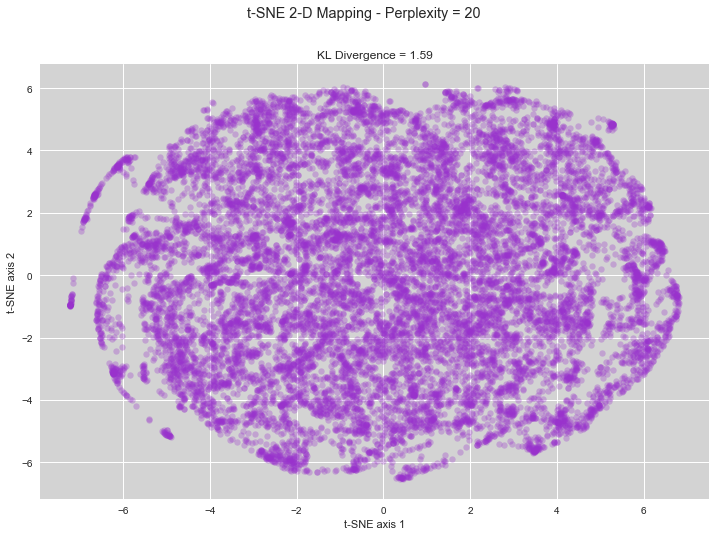

C:/Users/Preeti/Github/CapstoneProject/unsupervised/t_sne_mapping_perplex__0020_18.10.19.csv
[t-SNE] Computing pairwise distances...
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 14887
[t-SNE] Computed conditional probabilities for sample 2000 / 14887
[t-SNE] Computed conditional probabilities for sample 3000 / 14887
[t-SNE] Computed conditional probabilities for sample 4000 / 14887
[t-SNE] Computed conditional probabilities for sample 5000 / 14887
[t-SNE] Computed conditional probabilities for sample 6000 / 14887
[t-SNE] Computed conditional probabilities for sample 7000 / 14887
[t-SNE] Computed conditional probabilities for sample 8000 / 14887
[t-SNE] Computed conditional probabilities for sample 9000 / 14887
[t-SNE] Computed conditional probabilities for sample 10000 / 14887
[t-SNE] Computed conditional probabilities for sample 11000 / 14887
[t-SNE] Computed conditional probabilities for sample 12000 / 14887
[t-SNE] Computed 

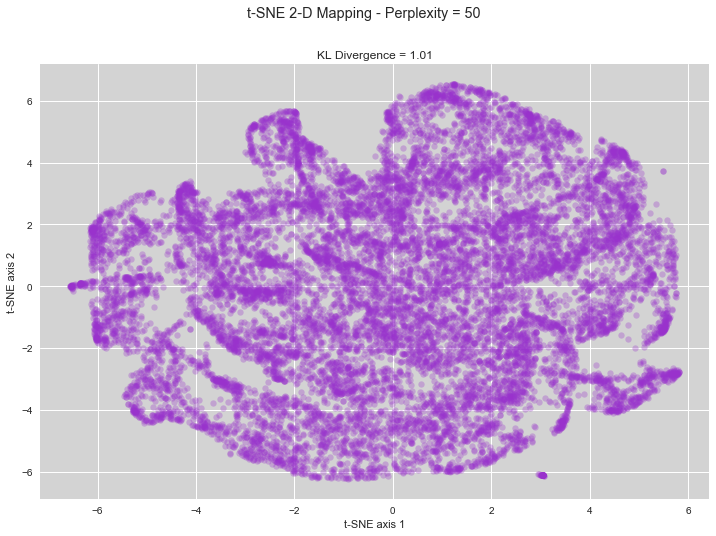

C:/Users/Preeti/Github/CapstoneProject/unsupervised/t_sne_mapping_perplex__0050_18.10.19.csv
[t-SNE] Computing pairwise distances...
[t-SNE] Computing 226 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 14887
[t-SNE] Computed conditional probabilities for sample 2000 / 14887
[t-SNE] Computed conditional probabilities for sample 3000 / 14887
[t-SNE] Computed conditional probabilities for sample 4000 / 14887
[t-SNE] Computed conditional probabilities for sample 5000 / 14887
[t-SNE] Computed conditional probabilities for sample 6000 / 14887
[t-SNE] Computed conditional probabilities for sample 7000 / 14887
[t-SNE] Computed conditional probabilities for sample 8000 / 14887
[t-SNE] Computed conditional probabilities for sample 9000 / 14887
[t-SNE] Computed conditional probabilities for sample 10000 / 14887
[t-SNE] Computed conditional probabilities for sample 11000 / 14887
[t-SNE] Computed conditional probabilities for sample 12000 / 14887
[t-SNE] Computed 

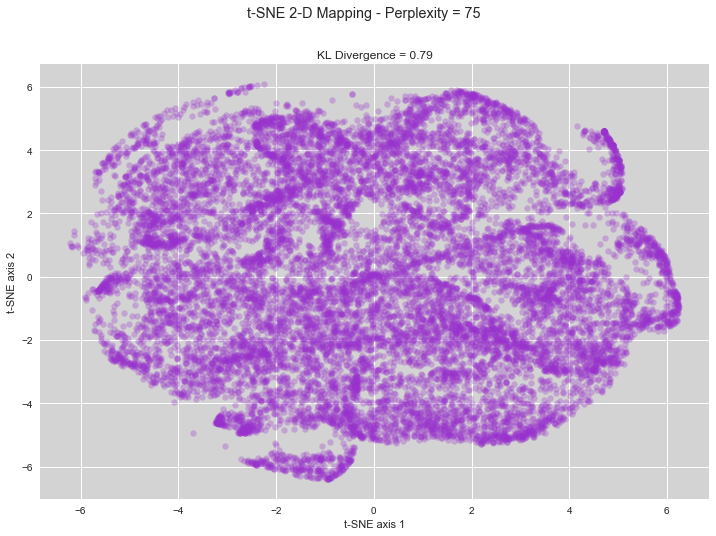

C:/Users/Preeti/Github/CapstoneProject/unsupervised/t_sne_mapping_perplex__0075_18.10.19.csv
[t-SNE] Computing pairwise distances...
[t-SNE] Computing 601 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 14887
[t-SNE] Computed conditional probabilities for sample 2000 / 14887
[t-SNE] Computed conditional probabilities for sample 3000 / 14887
[t-SNE] Computed conditional probabilities for sample 4000 / 14887
[t-SNE] Computed conditional probabilities for sample 5000 / 14887
[t-SNE] Computed conditional probabilities for sample 6000 / 14887
[t-SNE] Computed conditional probabilities for sample 7000 / 14887
[t-SNE] Computed conditional probabilities for sample 8000 / 14887
[t-SNE] Computed conditional probabilities for sample 9000 / 14887
[t-SNE] Computed conditional probabilities for sample 10000 / 14887
[t-SNE] Computed conditional probabilities for sample 11000 / 14887
[t-SNE] Computed conditional probabilities for sample 12000 / 14887
[t-SNE] Computed 

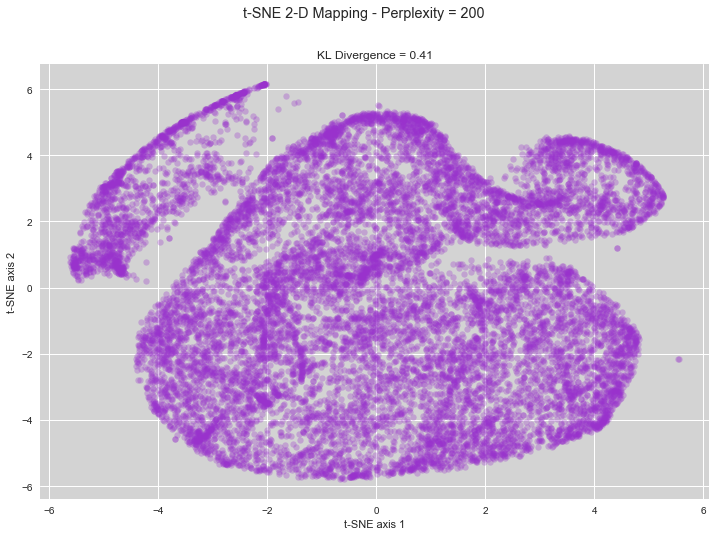

C:/Users/Preeti/Github/CapstoneProject/unsupervised/t_sne_mapping_perplex__0200_18.10.19.csv
[t-SNE] Computing pairwise distances...
[t-SNE] Computing 1201 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 14887
[t-SNE] Computed conditional probabilities for sample 2000 / 14887
[t-SNE] Computed conditional probabilities for sample 3000 / 14887
[t-SNE] Computed conditional probabilities for sample 4000 / 14887
[t-SNE] Computed conditional probabilities for sample 5000 / 14887
[t-SNE] Computed conditional probabilities for sample 6000 / 14887
[t-SNE] Computed conditional probabilities for sample 7000 / 14887
[t-SNE] Computed conditional probabilities for sample 8000 / 14887
[t-SNE] Computed conditional probabilities for sample 9000 / 14887
[t-SNE] Computed conditional probabilities for sample 10000 / 14887
[t-SNE] Computed conditional probabilities for sample 11000 / 14887
[t-SNE] Computed conditional probabilities for sample 12000 / 14887
[t-SNE] Computed

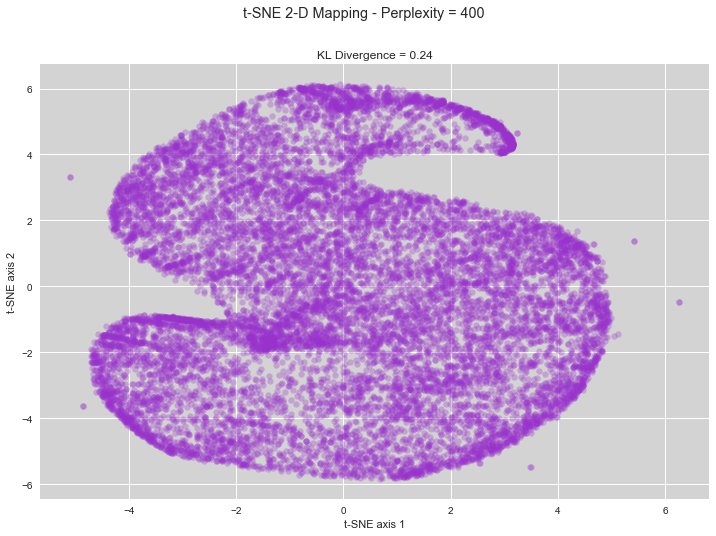

C:/Users/Preeti/Github/CapstoneProject/unsupervised/t_sne_mapping_perplex__0400_18.10.19.csv
[t-SNE] Computing pairwise distances...
[t-SNE] Computing 1501 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 14887
[t-SNE] Computed conditional probabilities for sample 2000 / 14887
[t-SNE] Computed conditional probabilities for sample 3000 / 14887
[t-SNE] Computed conditional probabilities for sample 4000 / 14887
[t-SNE] Computed conditional probabilities for sample 5000 / 14887
[t-SNE] Computed conditional probabilities for sample 6000 / 14887
[t-SNE] Computed conditional probabilities for sample 7000 / 14887
[t-SNE] Computed conditional probabilities for sample 8000 / 14887
[t-SNE] Computed conditional probabilities for sample 9000 / 14887
[t-SNE] Computed conditional probabilities for sample 10000 / 14887
[t-SNE] Computed conditional probabilities for sample 11000 / 14887
[t-SNE] Computed conditional probabilities for sample 12000 / 14887
[t-SNE] Computed

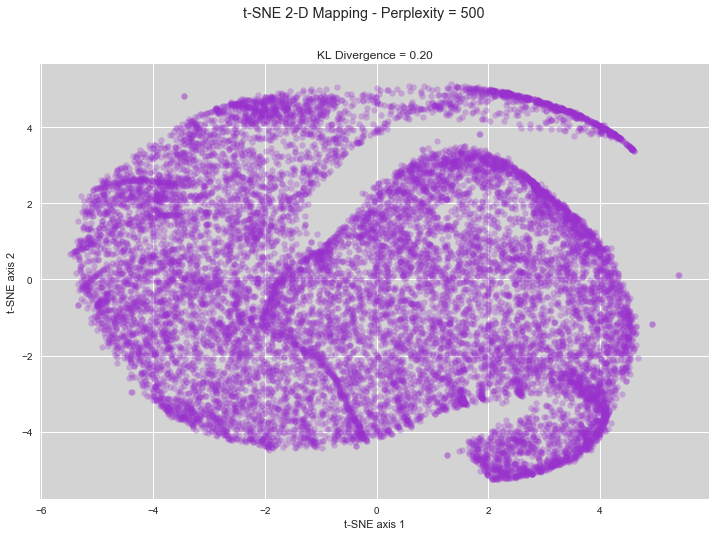

C:/Users/Preeti/Github/CapstoneProject/unsupervised/t_sne_mapping_perplex__0500_18.10.19.csv


In [40]:
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... t-sne for loop - evaluate range of perplexity values
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

for perplex in [20,50,75,200,400,500] :

    i_index = i_index + 1
    tic = time.clock()

    tsne = TSNE(n_components = 2, verbose = 1, perplexity = perplex, n_iter = 300)

    tsne_results = tsne.fit_transform(X1)
    tsne_kl_diverge = tsne.kl_divergence_

    toc = time.clock()
    print (toc - tic)
    
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - save statistics for model comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

    exe_time = '{0:.4f}'.format(toc-tic)
    
    raw_data = {
    'model_name' : 't-SNE - 2D',
    'perplexity' : perplex,
    'kl_divergence': tsne_kl_diverge,
    'process_time' : exe_time
    }

    df_tbl = pd.DataFrame(raw_data,
                            columns = ['model_name',
                                       'perplexity',
                                       'kl_divergence',
                                       'process_time'],
                            index = [i_index])
    
    tsne_tbl = tsne_tbl.append(df_tbl)

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - plot clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

    _ = plt.figure(figsize = (12, 8))
    _ = plt.subplot(111, facecolor = 'lightgrey')
    
    _ = plt.scatter(tsne_results[:, 0], tsne_results[:, 1],
                 s = 40,
                 c = 'darkorchid', 
                 linewidths = 0,
                 alpha = 0.30)
    
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2')
        
    _ = plt.suptitle("t-SNE 2-D Mapping - Perplexity = %d" %perplex)
    _ = plt.title("KL Divergence = %.2f" %tsne_kl_diverge)
    _ = plt.grid(True)
    
    data_dir = 'C:/Users/Preeti/Github/CapstoneProject/unsupervised/'
    data_file_base = "t_sne_mapping_perplex_"
    data_file_num = "%04d" %perplex
    #data_file_time = datetime.now().strftime("%Y%0m%0d_%H%M%S")
    data_file_time = '18.10.19'
    data_file_ext = ".png"
    plt_file_2_save = data_dir + data_file_base + data_file_num + data_file_time + data_file_ext
    
    plt.savefig(plt_file_2_save)

    plt.show();
    
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
# ... store in ../data/ directory
# ... write as .csv file for future recall
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=

    df_out['x-tsne'] = tsne_results[:,0];
    df_out['y-tsne'] = tsne_results[:,1];

    data_dir = 'C:/Users/Preeti/Github/CapstoneProject/unsupervised/'
    data_file_base = "t_sne_mapping_perplex_"
    data_file_num = "_%04d_" %perplex
    #data_file_time = datetime.now().strftime("%Y%0m%0d_%H%M%S")
    data_file_time = '18.10.19'
    data_file_ext = ".csv"
    file_2_write = data_dir + data_file_base + data_file_num + data_file_time + data_file_ext
    
    print(file_2_write)

    df_out.to_csv(file_2_write, index = False)
    
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
# ... end of for loop on t-sne perplex
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=

In [114]:
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... read in t-SNE vectors
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
df_tsne = pd.read_csv('C:/Users/Preeti/Github/CapstoneProject/unsupervised/t_sne_mapping_perplex__0200_18.10.19.csv')
df_tsne.head()

,x-tsne,y-tsne,sample_index
0,-2.766090,-2.404393,31486
1,-0.422276,3.378023,2884
2,3.667037,-2.585735,12517
3,-2.022680,1.179967,15110
4,-1.816933,2.369185,11731


In [115]:
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... join t-sne vectors with base data, since we sampled to create
# ...     the t-sne mapping
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

df_join = df_tsne.set_index('sample_index').join(df.set_index('id'))
df_join.fillna('0',inplace=True)
df_join.head()

,x-tsne,y-tsne,loan_amnt,term,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,...,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,n_term
sample_index,,,,,,,,,,,,,,,,,,,,,
31486,-2.766090,-2.404393,10000,36 months,4 years,RENT,50000.0,Not Verified,Approved,debt_consolidation,...,0.0,0.0,0.0,7.0,0.0,13328,98.7,12.0,0.0,36
2884,-0.422276,3.378023,12000,60 months,7 years,MORTGAGE,25000.0,Verified,Declined,debt_consolidation,...,1.0,0.0,0.0,4.0,0.0,9845,97.5,12.0,0.0,60
12517,3.667037,-2.585735,12000,36 months,7 years,MORTGAGE,55000.0,Source Verified,Approved,debt_consolidation,...,0.0,0.0,0.0,6.0,0.0,4110,25.8,14.0,0.0,36
15110,-2.022680,1.179967,15000,60 months,1 year,RENT,59000.0,Source Verified,Declined,debt_consolidation,...,0.0,0.0,0.0,9.0,0.0,6477,80.0,16.0,0.0,60
11731,-1.816933,2.369185,15000,36 months,9 years,RENT,97440.0,Verified,Approved,debt_consolidation,...,1.0,27.0,0.0,11.0,0.0,687,4.3,36.0,0.0,36


In [116]:
col_names = df_join.columns.values.tolist()
col_names
df_join.describe().T


['x-tsne',
 'y-tsne',
 'loan_amnt',
 'term',
 'emp_length',
 'home_ownership',
 'annual_inc',
 'verification_status',
 'loan_status',
 'purpose',
 'addr_state',
 'dti',
 'delinq_2yrs',
 'inq_last_6mths',
 'mths_since_last_delinq',
 'mths_since_last_record',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'revol_util',
 'total_acc',
 'pub_rec_bankruptcies',
 'n_term']

,count,mean,std,min,25%,50%,75%,max
x-tsne,14887.0,-0.049110,2.726807,-5.613307,-2.245322,-0.067776,2.145360,5.547786e+00
y-tsne,14887.0,-0.070449,3.050001,-5.778499,-2.650913,-0.080954,2.554703,6.157137e+00
loan_amnt,14887.0,11053.209176,7420.285744,500.000000,5000.000000,9600.000000,15000.000000,3.500000e+04
annual_inc,14887.0,68863.827613,54707.379646,1896.000000,40000.000000,58650.000000,82021.000000,1.440000e+06
dti,14887.0,13.347379,6.732172,0.000000,8.160000,13.440000,18.710000,2.999000e+01
delinq_2yrs,14887.0,0.153893,0.510565,0.000000,0.000000,0.000000,0.000000,9.000000e+00
inq_last_6mths,14887.0,1.078928,1.535733,0.000000,0.000000,1.000000,2.000000,2.800000e+01
mths_since_last_delinq,14887.0,12.909854,21.729007,0.000000,0.000000,0.000000,21.000000,1.070000e+02
mths_since_last_record,14887.0,5.147914,21.731126,0.000000,0.000000,0.000000,0.000000,1.290000e+02
open_acc,14887.0,9.306979,4.505696,0.000000,6.000000,9.000000,12.000000,4.700000e+01


In [117]:
# set required variables for model comparison

kmeans_tbl = pd.DataFrame(columns = [
    'model_name',
    'n_clusters',
    'inertia',
    'silhouette',
    'process_time'])

i_index = []
i_index = 0

# preparation for cross validation and model comparison, each classifier is appended once model is fit

models = []

n_lda =  2


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  144114.45782964464
silhouette =  0.3857744092560834
0 -0.4068136160311127 2.5756266224382776 0
1 0.3049119555134349 -2.6892933190246744 1


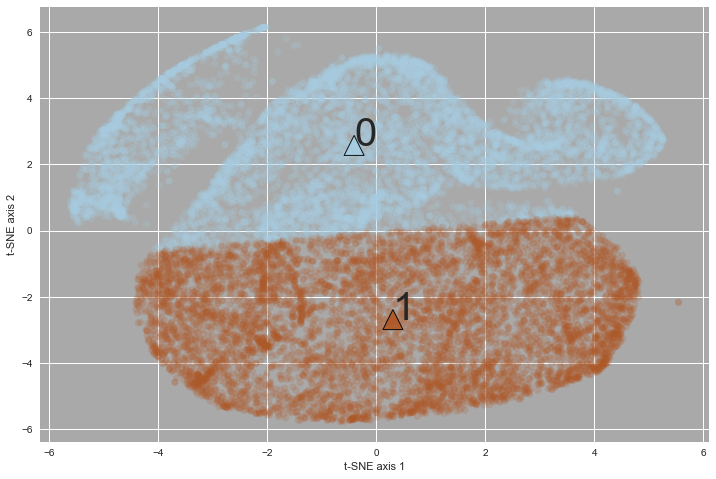

n_lda =  3


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  97232.22437064926
silhouette =  0.3890472103331875
0 -2.945414544148714 -0.7076472324637002 0
1 1.8407568389707858 -2.8258113908329854 1
2 0.8272825428433712 3.100739138311517 2


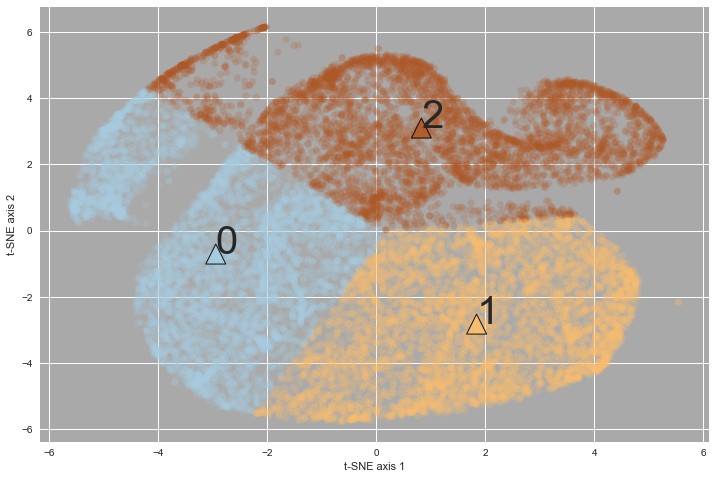

n_lda =  4


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  69279.90904088756
silhouette =  0.40108609854330224
0 -3.0080248109217704 2.1876815061662245 0
1 2.40821391944679 -2.5555988937754064 1
2 -2.08454633134813 -2.8195372895837942 2
3 1.660174645783954 2.9024043727443583 3


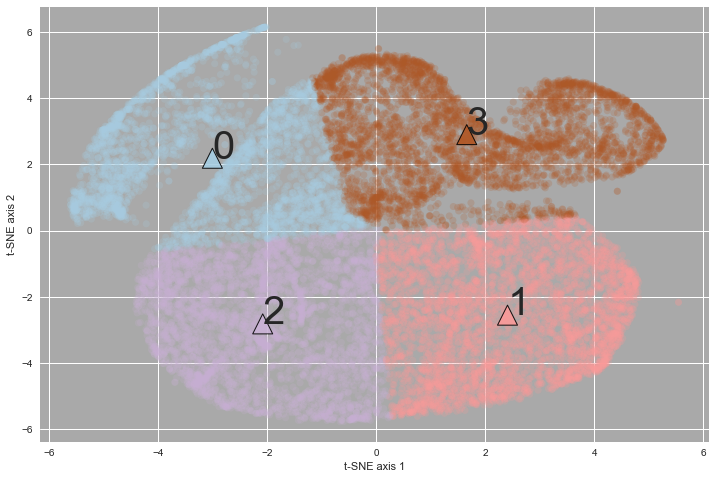

n_lda =  5


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  59716.48777203229
silhouette =  0.4207588697734659
0 -2.085071644861372 -2.8193849875187307 0
1 0.371851107461619 3.0224337396422185 1
2 3.4494445093965425 2.7361773967794423 2
3 2.407607487130931 -2.555155203660651 3
4 -3.0070800686575616 2.1887620427689765 4


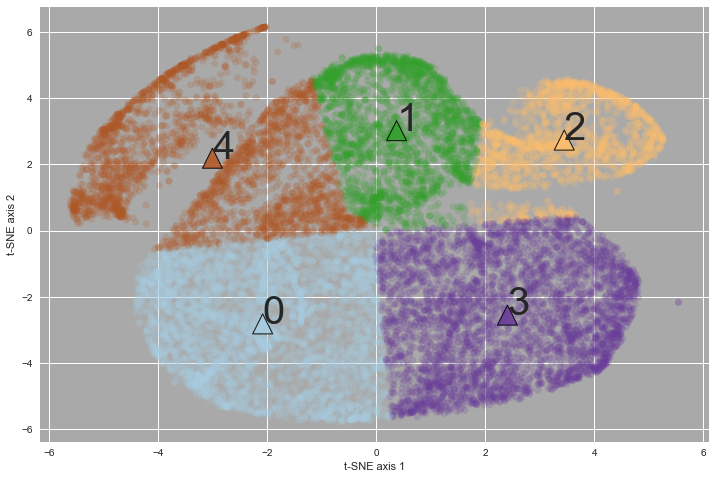

n_lda =  6


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=6, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  51348.77431573147
silhouette =  0.48608560723267985
0 -3.337911100240983 1.2897966491195583 0
1 3.4503802165490995 2.7365368361583045 1
2 2.407607487130931 -2.555155203660651 2
3 -2.085071644861372 -2.8193849875187307 3
4 0.37246462448472867 3.0220549902893885 4
5 -2.3800569245030134 3.8925686805996498 5


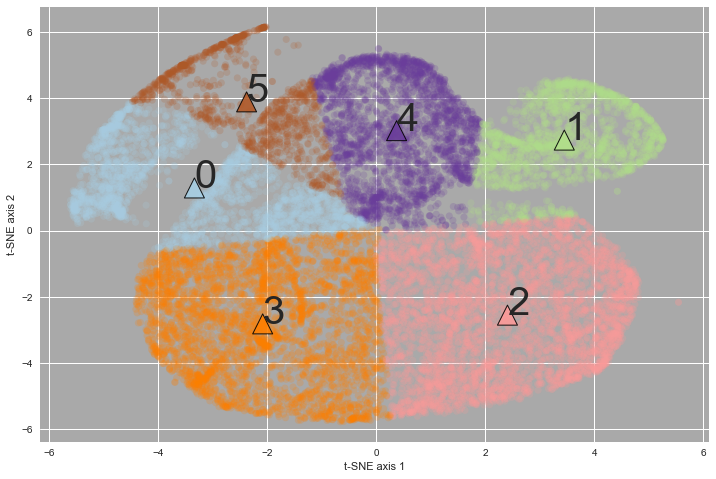

n_lda =  7


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=7, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  43864.06614730419
silhouette =  0.5264839210676404
0 2.1477405045272118 -3.935493794201304 0
1 0.37246462448472867 3.0220549902893885 1
2 -2.085071644861372 -2.8193849875187307 2
3 3.4503802165490995 2.7365368361583045 3
4 2.6548817965688216 -1.2417052672871645 4
5 -3.337911100240983 1.2897966491195583 5
6 -2.3800569245030134 3.8925686805996498 6


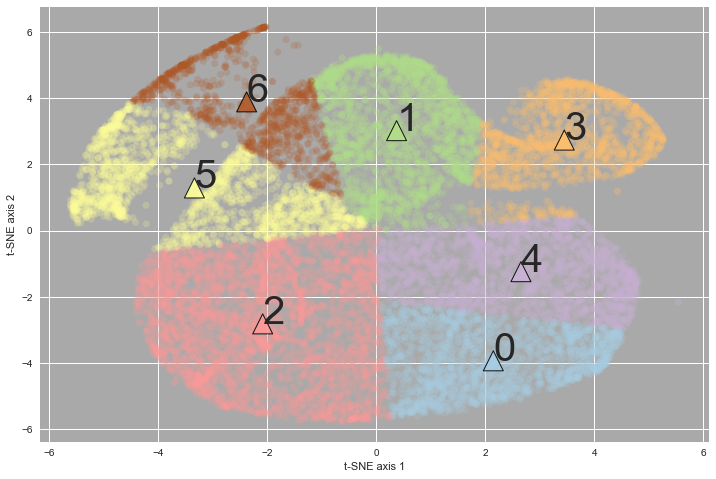

n_lda =  8


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  37529.04711504775
silhouette =  0.5666293741607434
0 -2.3800569245030134 3.8925686805996498 0
1 2.149694395674859 -3.933718117971002 1
2 0.37246462448472867 3.0220549902893885 2
3 -3.337911100240983 1.2897966491195583 3
4 -2.3336645627494823 -1.6563715966748302 4
5 3.4503802165490995 2.7365368361583045 5
6 2.653762775888261 -1.239438539855623 6
7 -1.7762281533629638 -4.264273761258002 7


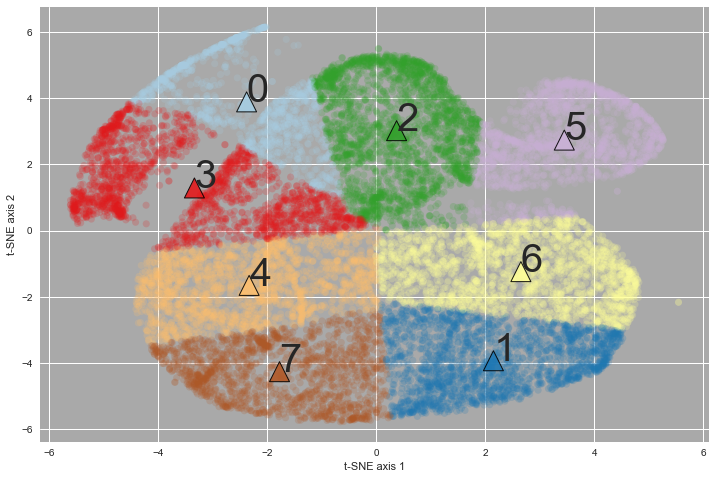

n_lda =  9


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=9, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  33006.31085119723
silhouette =  0.6271208763661005
0 3.4503802165490995 2.7365368361583045 0
1 2.149694395674859 -3.933718117971002 1
2 -2.3336645627494823 -1.6563715966748302 2
3 -2.3800569245030134 3.8925686805996498 3
4 -2.0538726716324076 0.7085699025244591 4
5 0.37246462448472867 3.0220549902893885 5
6 2.653762775888261 -1.239438539855623 6
7 -1.7762281533629638 -4.264273761258002 7
8 -4.706393061872164 1.9092472049684923 8


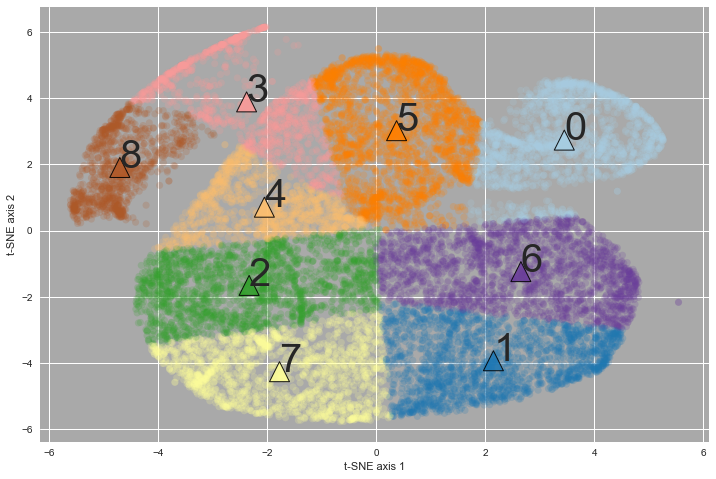

n_lda =  10


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  29216.32148020586
silhouette =  0.6819448356934074
0 2.149694395674859 -3.933718117971002 0
1 -2.0538726716324076 0.7085699025244591 1
2 -2.3336645627494823 -1.6563715966748302 2
3 2.653762775888261 -1.239438539855623 3
4 -2.3800569245030134 3.8925686805996498 4
5 3.4503802165490995 2.7365368361583045 5
6 0.5081081305791231 1.7115522189106642 6
7 -1.7762281533629638 -4.264273761258002 7
8 -4.706393061872164 1.9092472049684923 8
9 0.24855010050257795 4.219239667745861 9


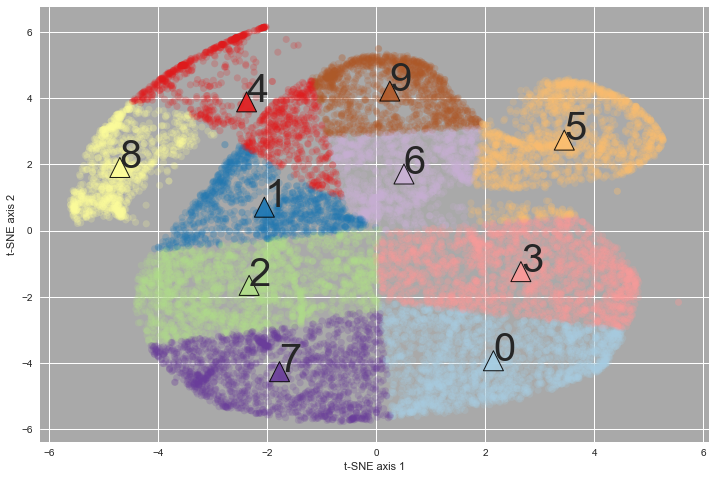

n_lda =  11


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=11, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  26423.779770408586
silhouette =  0.7042981621013132
0 0.2514285888038799 4.214502747270883 0
1 -2.0538726716324076 0.7085699025244591 1
2 2.149694395674859 -3.933718117971002 2
3 -2.3336645627494823 -1.6563715966748302 3
4 1.4643902756075087 -1.0540724794896006 4
5 3.4503802165490995 2.7365368361583045 5
6 -1.7762281533629638 -4.264273761258002 6
7 -4.706393061872164 1.9092472049684923 7
8 -2.3800569245030134 3.8925686805996498 8
9 3.7773739749142234 -1.4145555711451612 9
10 0.5060730652803117 1.7057438219313046 10


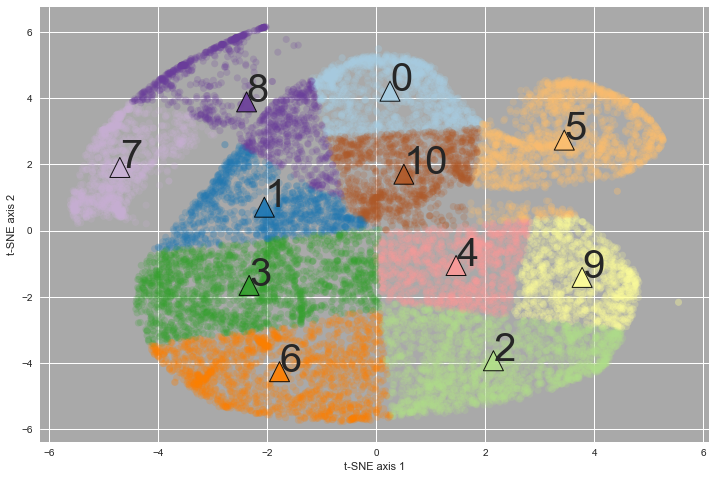

n_lda =  12


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=12, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  24089.99818461808
silhouette =  0.7431107706174078
0 -2.0538726716324076 0.7085699025244591 0
1 0.5060730652803117 1.7057438219313046 1
2 0.2514285888038799 4.214502747270883 2
3 -1.2369967457216293 -1.3601480770213223 3
4 1.4643902756075087 -1.0540724794896006 4
5 -4.706393061872164 1.9092472049684923 5
6 -1.7762281533629638 -4.264273761258002 6
7 3.4503802165490995 2.7365368361583045 7
8 -2.3800569245030134 3.8925686805996498 8
9 2.149694395674859 -3.933718117971002 9
10 3.7773739749142234 -1.4145555711451612 10
11 -3.342987155412287 -1.9290020926391205 11


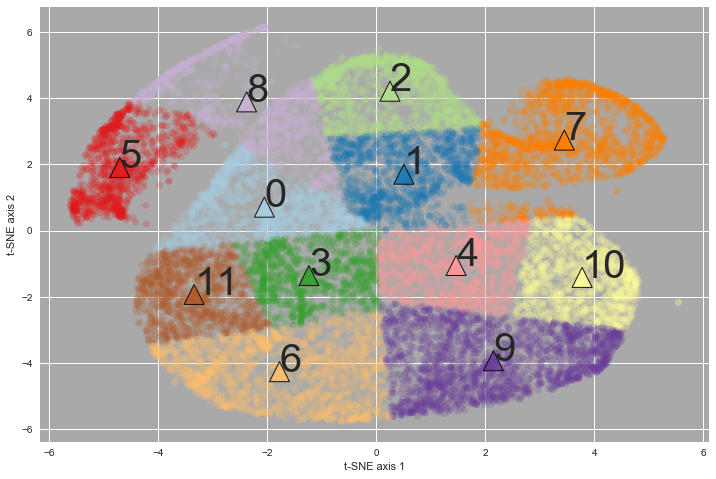

n_lda =  13


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=13, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  21792.420939881722
silhouette =  0.77654976093575
0 3.4503802165490995 2.7365368361583045 0
1 -1.241626476236949 -1.3606525302195276 1
2 -4.706393061872164 1.9092472049684923 2
3 3.5113280398749454 -3.7105199728221088 3
4 0.2514285888038799 4.214502747270883 4
5 -2.3800569245030134 3.8925686805996498 5
6 -1.7762281533629638 -4.264273761258002 6
7 0.5060730652803117 1.7057438219313046 7
8 3.7773739749142234 -1.4145555711451612 8
9 -3.347006913511361 -1.9307802072059106 9
10 1.4643902756075087 -1.0540724794896006 10
11 -2.0538726716324076 0.7085699025244591 11
12 1.3057534098769714 -4.072056402609878 12


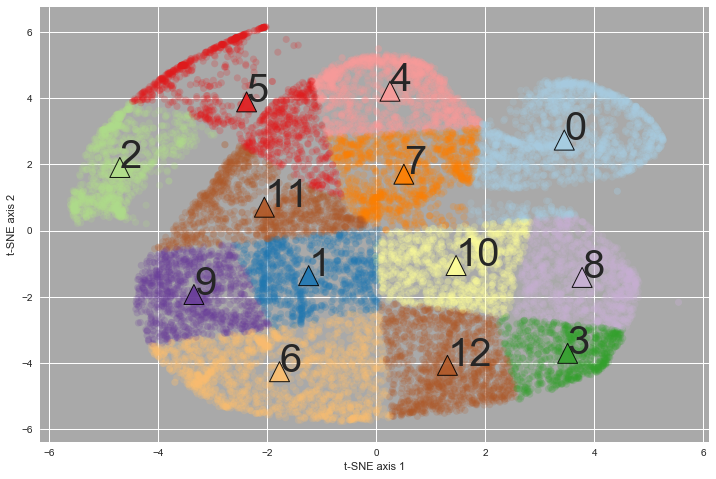

n_lda =  14


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=14, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  19709.559751688834
silhouette =  0.810270161099633
0 3.4503802165490995 2.7365368361583045 0
1 1.4643902756075087 -1.0540724794896006 1
2 0.5060730652803117 1.7057438219313046 2
3 -2.3800569245030134 3.8925686805996498 3
4 -3.347006913511361 -1.9307802072059106 4
5 0.2514285888038799 4.214502747270883 5
6 -2.7764019789193983 -4.066256998259655 6
7 1.310513972256002 -4.072534361896448 7
8 -4.706393061872164 1.9092472049684923 8
9 -1.241626476236949 -1.3606525302195276 9
10 -2.0538726716324076 0.7085699025244591 10
11 3.518465707926971 -3.7072975687574763 11
12 3.7773739749142234 -1.4145555711451612 12
13 -0.7344886623288568 -4.470519792329001 13


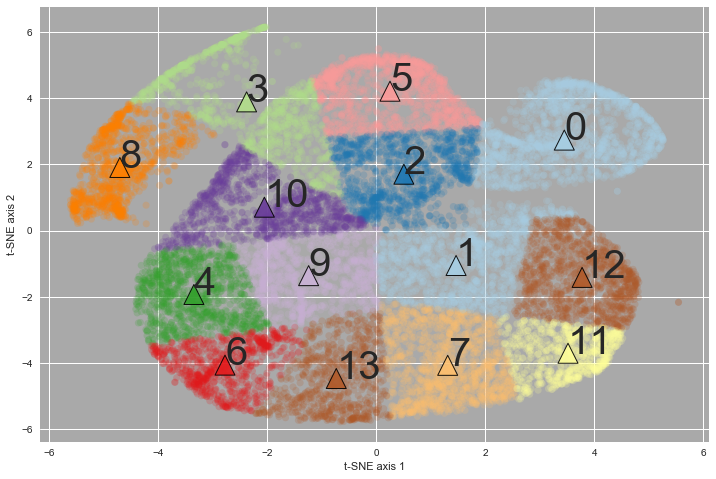

n_lda =  15


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=15, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  18030.791310366094
silhouette =  0.8369890462951065
0 3.518465707926971 -3.7072975687574763 0
1 1.4643902756075087 -1.0540724794896006 1
2 -1.6702383962687373 3.014508816252957 2
3 0.2514285888038799 4.214502747270883 3
4 3.4503802165490995 2.7365368361583045 4
5 -0.7344886623288568 -4.470519792329001 5
6 1.310513972256002 -4.072534361896448 6
7 -4.706393061872164 1.9092472049684923 7
8 0.5060730652803117 1.7057438219313046 8
9 -2.0538726716324076 0.7085699025244591 9
10 3.7773739749142234 -1.4145555711451612 10
11 -1.241626476236949 -1.3606525302195276 11
12 -3.347006913511361 -1.9307802072059106 12
13 -2.7764019789193983 -4.066256998259655 13
14 -3.205680778840764 4.913882073678532 14


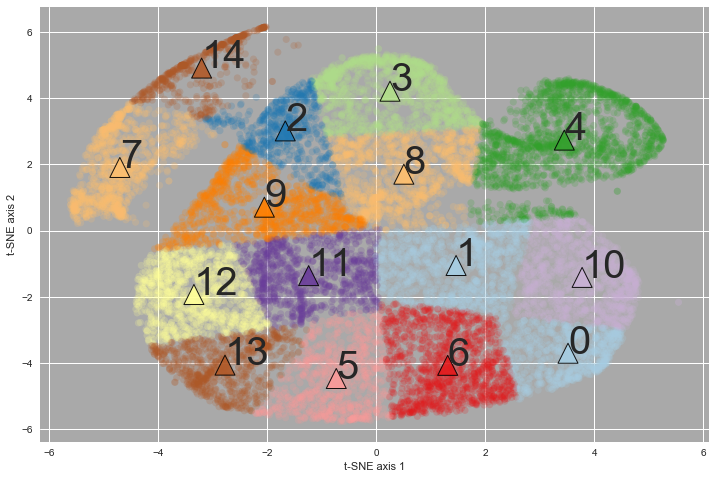

n_lda =  16


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=16, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  16475.79570867769
silhouette =  0.8326020789599772
0 -4.706393061872164 1.9092472049684923 0
1 2.7134369896166675 1.9515484359046733 1
2 -2.7764019789193983 -4.066256998259655 2
3 1.310513972256002 -4.072534361896448 3
4 0.2514285888038799 4.214502747270883 4
5 -2.0538726716324076 0.7085699025244591 5
6 0.5060730652803117 1.7057438219313046 6
7 -0.7344886623288568 -4.470519792329001 7
8 1.4643902756075087 -1.0540724794896006 8
9 3.518465707926971 -3.7072975687574763 9
10 3.7773739749142234 -1.4145555711451612 10
11 -1.6702383962687373 3.014508816252957 11
12 -3.347006913511361 -1.9307802072059106 12
13 -1.241626476236949 -1.3606525302195276 13
14 -3.205680778840764 4.913882073678532 14
15 4.024404176370448 3.347984412388913 15


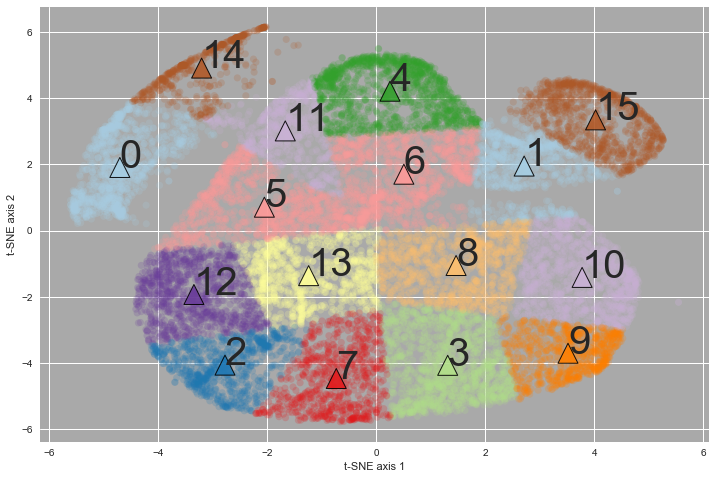

n_lda =  17


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=17, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  15627.543759592118
silhouette =  0.871105943403296
0 0.2514285888038799 4.214502747270883 0
1 3.7773739749142234 -1.4145555711451612 1
2 1.310513972256002 -4.072534361896448 2
3 4.025125630507326 3.3500362365506797 3
4 -3.347006913511361 -1.9307802072059106 4
5 -4.419922886550014 2.8079815077384067 5
6 1.4643902756075087 -1.0540724794896006 6
7 -1.241626476236949 -1.3606525302195276 7
8 -2.0538726716324076 0.7085699025244591 8
9 2.7159832987136046 1.952620935656925 9
10 0.5060730652803117 1.7057438219313046 10
11 -2.7764019789193983 -4.066256998259655 11
12 3.518465707926971 -3.7072975687574763 12
13 -1.6702383962687373 3.014508816252957 13
14 -0.7344886623288568 -4.470519792329001 14
15 -3.205680778840764 4.913882073678532 15
16 -4.970499394511163 1.0806743161694605 16


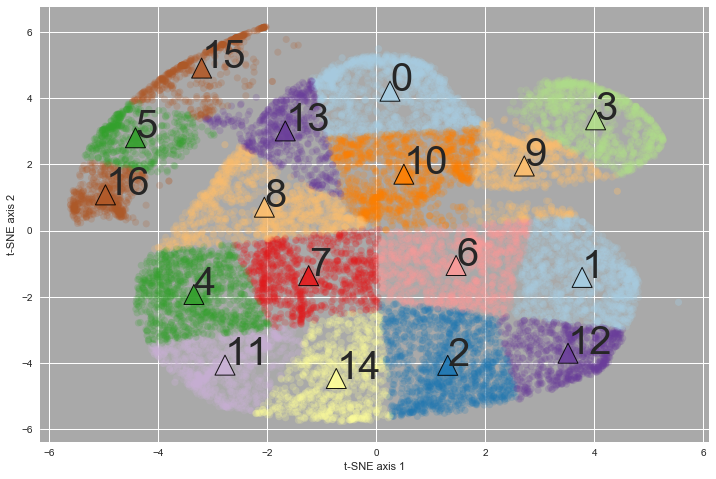

n_lda =  18


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=18, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  14871.38142814427
silhouette =  0.8735741377707762
0 3.518465707926971 -3.7072975687574763 0
1 -1.241626476236949 -1.3606525302195276 1
2 0.5060730652803117 1.7057438219313046 2
3 0.2514285888038799 4.214502747270883 3
4 1.310513972256002 -4.072534361896448 4
5 3.7773739749142234 -1.4145555711451612 5
6 -2.845894806462795 0.9745681264198811 6
7 -2.7764019789193983 -4.066256998259655 7
8 1.4643902756075087 -1.0540724794896006 8
9 4.025125630507326 3.3500362365506797 9
10 -3.347006913511361 -1.9307802072059106 10
11 -1.6702383962687373 3.014508816252957 11
12 2.7159832987136046 1.952620935656925 12
13 -4.971950169794247 1.075788219537633 13
14 -0.7344886623288568 -4.470519792329001 14
15 -3.205680778840764 4.913882073678532 15
16 -4.421677525322427 2.8028354959614954 16
17 -1.2760955392270315 0.44735581934658186 17


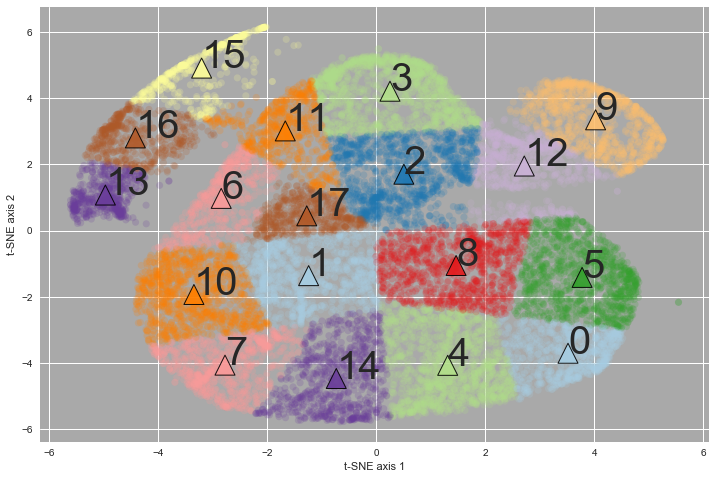

n_lda =  19


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=19, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  14244.996941005142
silhouette =  0.8725898489849029
0 4.025125630507326 3.3500362365506797 0
1 -2.7764019789193983 -4.066256998259655 1
2 -3.347006913511361 -1.9307802072059106 2
3 1.310513972256002 -4.072534361896448 3
4 -0.4524601106788308 4.383389260295005 4
5 -1.241626476236949 -1.3606525302195276 5
6 -2.8472910512660157 0.9752130461092723 6
7 1.4643902756075087 -1.0540724794896006 7
8 3.7773739749142234 -1.4145555711451612 8
9 0.5060730652803117 1.7057438219313046 9
10 3.518465707926971 -3.7072975687574763 10
11 2.7159832987136046 1.952620935656925 11
12 -1.6702383962687373 3.014508816252957 12
13 -4.971950169794247 1.075788219537633 13
14 -0.7344886623288568 -4.470519792329001 14
15 -3.205680778840764 4.913882073678532 15
16 -1.2775476861740351 0.4476713149953341 16
17 -4.421677525322427 2.8028354959614954 17
18 0.9224252929836615 4.05350812737872 18


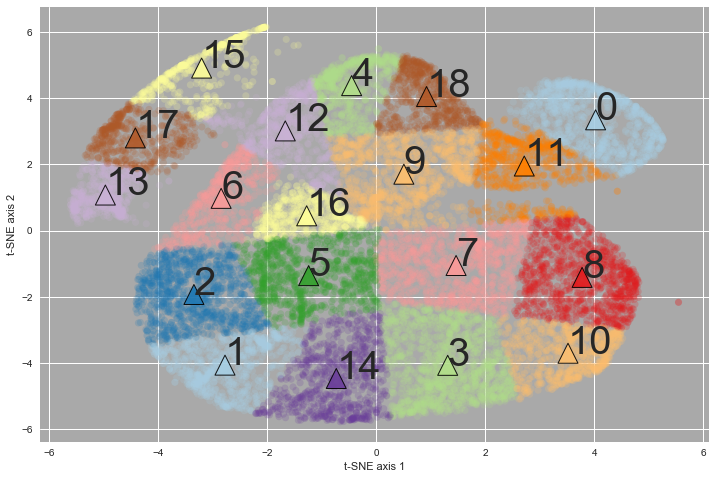

n_lda =  20


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=20, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  13644.538091501116
silhouette =  0.8825659752504418
0 -2.7764019789193983 -4.066256998259655 0
1 -0.4532060714172209 4.38527157728735 1
2 -0.7344886623288568 -4.470519792329001 2
3 -1.241626476236949 -1.3606525302195276 3
4 1.4643902756075087 -1.0540724794896006 4
5 -1.6702383962687373 3.014508816252957 5
6 1.310513972256002 -4.072534361896448 6
7 4.025125630507326 3.3500362365506797 7
8 2.7159832987136046 1.952620935656925 8
9 3.518465707926971 -3.7072975687574763 9
10 3.7773739749142234 -1.4145555711451612 10
11 0.689715138000958 2.2952186943850656 11
12 -4.421677525322427 2.8028354959614954 12
13 -3.347006913511361 -1.9307802072059106 13
14 -2.8472910512660157 0.9752130461092723 14
15 0.920995894239484 4.052232521547607 15
16 -1.2775476861740351 0.4476713149953341 16
17 -3.205680778840764 4.913882073678532 17
18 -4.971950169794247 1.075788219537633 18
19 0.2514433005836179 0.8884047130668468 19


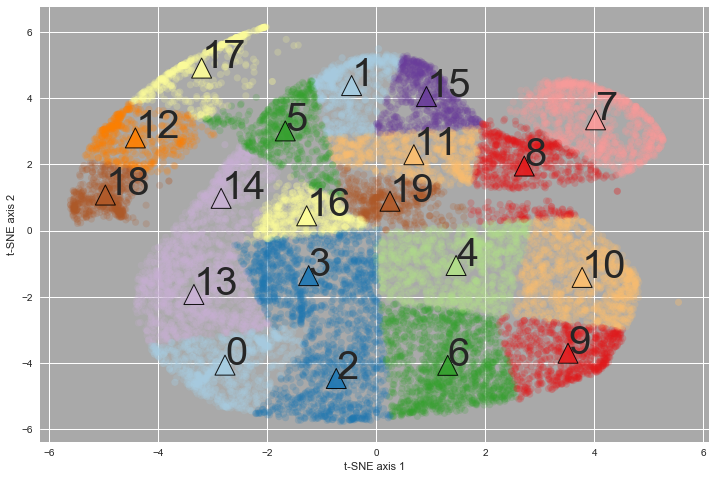

n_lda =  21


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=21, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  12831.456063708525
silhouette =  0.887563774355718
0 -1.241626476236949 -1.3606525302195276 0
1 -4.971950169794247 1.075788219537633 1
2 1.4218214031826186 -4.741844107351221 2
3 1.4643902756075087 -1.0540724794896006 3
4 0.6903030290517521 2.2938724116777602 4
5 -3.347006913511361 -1.9307802072059106 5
6 4.025125630507326 3.3500362365506797 6
7 3.7773739749142234 -1.4145555711451612 7
8 -0.7344886623288568 -4.470519792329001 8
9 0.920995894239484 4.052232521547607 9
10 -1.2775476861740351 0.4476713149953341 10
11 -2.7764019789193983 -4.066256998259655 11
12 3.518465707926971 -3.7072975687574763 12
13 -1.6702383962687373 3.014508816252957 13
14 2.7159832987136046 1.952620935656925 14
15 -0.4532060714172209 4.38527157728735 15
16 -3.205680778840764 4.913882073678532 16
17 -2.8472910512660157 0.9752130461092723 17
18 -4.421677525322427 2.8028354959614954 18
19 0.2497025262215288 0.8873164580946586 19
20 1.1476416702674643 -3.093156632322849 20


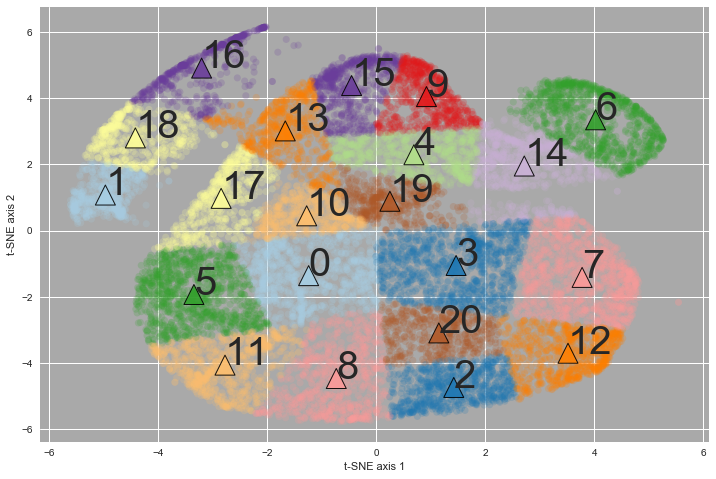

n_lda =  22


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=22, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  12262.396452095607
silhouette =  0.9000299418203924
0 3.518465707926971 -3.7072975687574763 0
1 -3.347006913511361 -1.9307802072059106 1
2 -1.6702383962687373 3.014508816252957 2
3 0.2497025262215288 0.8873164580946586 3
4 -1.2775476861740351 0.4476713149953341 4
5 4.025125630507326 3.3500362365506797 5
6 -0.7344886623288568 -4.470519792329001 6
7 -1.241626476236949 -1.3606525302195276 7
8 -2.7764019789193983 -4.066256998259655 8
9 1.4643902756075087 -1.0540724794896006 9
10 -0.4532060714172209 4.38527157728735 10
11 0.920995894239484 4.052232521547607 11
12 3.5397768880527054 -0.6438657053531353 12
13 -4.971950169794247 1.075788219537633 13
14 1.4218214031826186 -4.741844107351221 14
15 0.6903030290517521 2.2938724116777602 15
16 -3.205680778840764 4.913882073678532 16
17 2.7159832987136046 1.952620935656925 17
18 -4.421677525322427 2.8028354959614954 18
19 1.1476416702674643 -3.093156632322849 19
20 -2.8472910512660157 0.9752130461092723 20
21 3.9755100071396483 -2.0572462

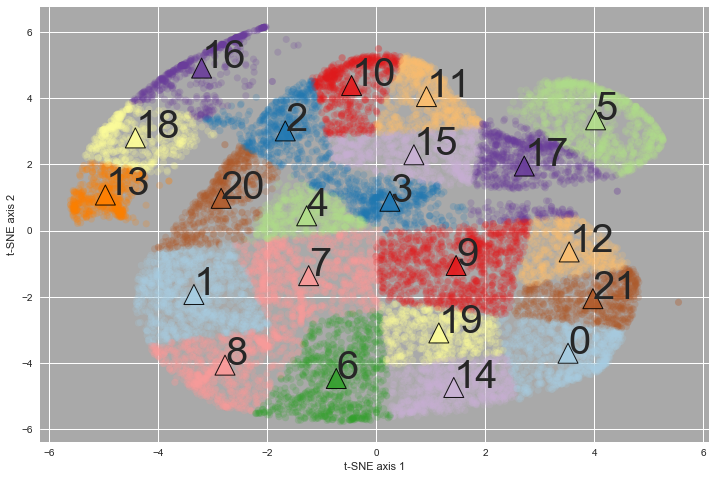

n_lda =  23


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=23, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  11669.077957340434
silhouette =  0.908446902122864
0 -2.8472910512660157 0.9752130461092723 0
1 3.536587225596491 -0.6398835445159828 1
2 0.6903030290517521 2.2938724116777602 2
3 1.4643902756075087 -1.0540724794896006 3
4 -3.347006913511361 -1.9307802072059106 4
5 -1.241626476236949 -1.3606525302195276 5
6 3.518465707926971 -3.7072975687574763 6
7 -4.421677525322427 2.8028354959614954 7
8 4.511139198666711 2.678705289689813 8
9 -0.7344886623288568 -4.470519792329001 9
10 -2.7764019789193983 -4.066256998259655 10
11 -1.2775476861740351 0.4476713149953341 11
12 -0.4532060714172209 4.38527157728735 12
13 2.7159832987136046 1.952620935656925 13
14 0.920995894239484 4.052232521547607 14
15 -4.971950169794247 1.075788219537633 15
16 -3.205680778840764 4.913882073678532 16
17 -1.6702383962687373 3.014508816252957 17
18 0.2497025262215288 0.8873164580946586 18
19 1.1476416702674643 -3.093156632322849 19
20 1.4218214031826186 -4.741844107351221 20
21 3.97586600826484 -2.053154772227

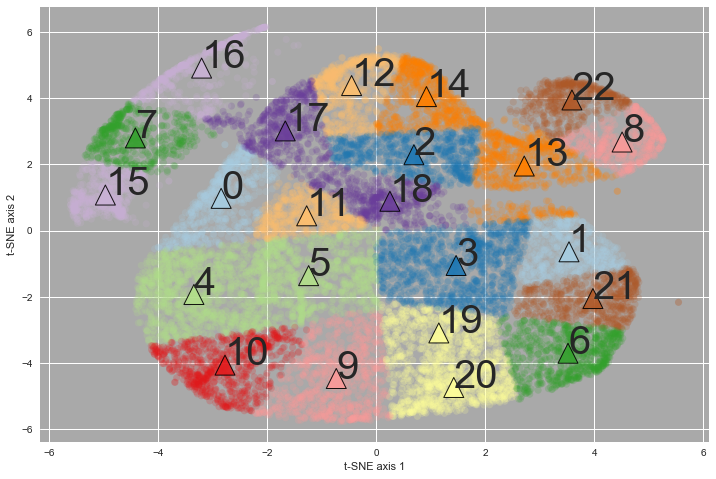

n_lda =  24


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=24, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  11159.71481136658
silhouette =  0.9206797485598456
0 1.1476416702674643 -3.093156632322849 0
1 1.4643902756075087 -1.0540724794896006 1
2 -1.2775476861740351 0.4476713149953341 2
3 2.7159832987136046 1.952620935656925 3
4 -0.5697081704875026 -3.6345017984191337 4
5 -1.241626476236949 -1.3606525302195276 5
6 -1.6702383962687373 3.014508816252957 6
7 0.920995894239484 4.052232521547607 7
8 -2.8472910512660157 0.9752130461092723 8
9 -3.347006913511361 -1.9307802072059106 9
10 4.508942135084988 2.6792233789364266 10
11 -3.205680778840764 4.913882073678532 11
12 -2.7764019789193983 -4.066256998259655 12
13 3.97586600826484 -2.0531547722273014 13
14 3.518465707926971 -3.7072975687574763 14
15 -4.971950169794247 1.075788219537633 15
16 1.4218214031826186 -4.741844107351221 16
17 -0.4532060714172209 4.38527157728735 17
18 0.2497025262215288 0.8873164580946586 18
19 0.6903030290517521 2.2938724116777602 19
20 -4.421677525322427 2.8028354959614954 20
21 3.536587225596491 -0.6398835445

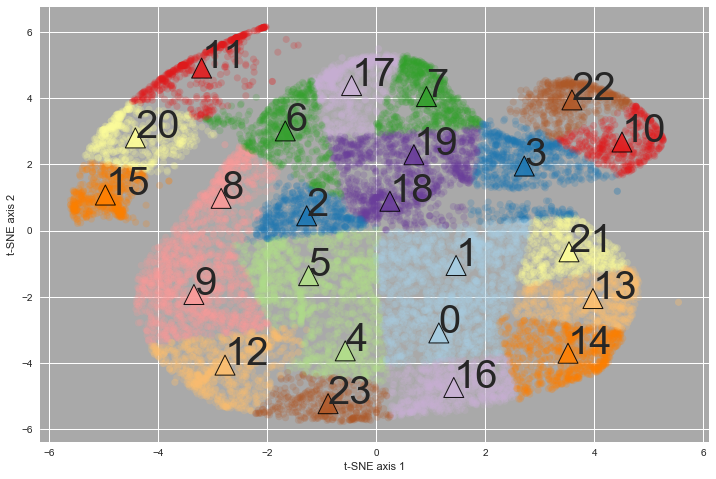

In [118]:
# ... k-means on the t-sne vectors

X_tsne = pd.DataFrame(columns=['t1', 't2'])
X_tsne['t1'] = df_join['x-tsne']
X_tsne['t2'] = df_join['y-tsne']

for n_lda in range(2, 25):  

    tic = time.clock()
    
    print ("n_lda = ", n_lda)

    cls_lda = KMeans(n_clusters = n_lda,
                     init = 'k-means++',
                     random_state = 1);
    
    cls_lda.fit(X_tsne)

    kmeans_labels = cls_lda.labels_ # the labels from kmeans clustering
    kmeans_centers = cls_lda.cluster_centers_

    kmeans_inertia = cls_lda.inertia_
    print ("inertia = ", kmeans_inertia)
    
    kmeans_silhouette = metrics.silhouette_score(X_tsne,
                                                 kmeans_labels,
                                                 metric = 'euclidean',
                                                 sample_size = 10000)
    print ("silhouette = ", kmeans_silhouette)
    column_name = "kmeans_" + str(n_lda)
    df_join[column_name] = kmeans_labels

    toc =  time.clock()
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - save statistics for model comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

    exe_time = '{0:.4f}'.format(toc-tic)
    
    raw_data = {
    'model_name' : 'KMeans - LDA features',
    'n_clusters' : n_lda,
    'inertia': kmeans_inertia,
    'silhouette': kmeans_silhouette, 
    'process_time' : exe_time
    }

    df_tbl = pd.DataFrame(raw_data,
    columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
    index = [i_index + 1])

    kmeans_tbl = kmeans_tbl.append(df_tbl, ignore_index=True)
    column_name = "kmeans_" + str(n_lda)
    X_tsne[column_name] = kmeans_labels
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - make some plots of clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
    
    _ = plt.figure(figsize=(12, 8));
    _ = plt.subplot(111, facecolor = 'darkgrey');
    
    X_tsne_values = X_tsne.values;
    _ = plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1],
                c = kmeans_labels,
                cmap = plt.cm.Paired,
                s = 50,
                linewidths = 0,
                alpha = 0.20);
    _ = plt.scatter(kmeans_centers[:, 0], kmeans_centers[:, 1],
                c = range(n_lda),
                cmap = plt.cm.Paired,
                s = 400,
                linewidths = 1.0,
                marker = '^',
                edgecolors = 'black',
                alpha = 0.90);
    
    for ii in range(n_lda) :                                       
        _ = plt.text(kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii, fontsize = 40)
        print(ii, kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii)
    
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2');
    _ = plt.grid(True);

    plt.show();

In [91]:
kmeans_tbl

,model_name,n_clusters,inertia,silhouette,process_time
0,KMeans - LDA features,2,144114.457830,0.381593,3.8468
1,KMeans - LDA features,3,97232.224371,0.390132,3.8199
2,KMeans - LDA features,4,69279.909041,0.400556,3.6357
3,KMeans - LDA features,5,59716.487772,0.424637,3.4579
4,KMeans - LDA features,6,51348.774316,0.484597,3.5714
5,KMeans - LDA features,7,43864.066147,0.530027,3.2032
6,KMeans - LDA features,8,37529.047115,0.566722,3.0804
7,KMeans - LDA features,9,33006.310851,0.626399,3.2568
8,KMeans - LDA features,10,29216.321480,0.682636,3.4969
9,KMeans - LDA features,11,26423.779770,0.705223,3.3037


In [119]:
## Run k means again for the finalized custer # to recreate centers and labels
n_lda = 8

In [120]:

# ... k-means on the t-sne vectors

X_tsne = pd.DataFrame(columns=['t1', 't2'])
X_tsne['t1'] = df_join['x-tsne']
X_tsne['t2'] = df_join['y-tsne']

print ("n_lda = ", n_lda)

cls_lda = KMeans(n_clusters = n_lda,
                 init = 'k-means++',
                 random_state = 1);

cls_lda.fit(X_tsne)

kmeans_labels = cls_lda.labels_ # the labels from kmeans clustering
kmeans_centers = cls_lda.cluster_centers_

kmeans_inertia = cls_lda.inertia_
print ("inertia = ", kmeans_inertia)

kmeans_silhouette = metrics.silhouette_score(X_tsne,
                                             kmeans_labels,
                                             metric = 'euclidean',
                                             sample_size = 10000)
print ("silhouette = ", kmeans_silhouette)
#column_name = "kmeans_" + str(n_lda)
#df_join[column_name] = kmeans_labels


n_lda =  8


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  31112.277563235988
silhouette =  0.3808557839505361


In [121]:
df_join.head()

,x-tsne,y-tsne,loan_amnt,term,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,...,kmeans_15,kmeans_16,kmeans_17,kmeans_18,kmeans_19,kmeans_20,kmeans_21,kmeans_22,kmeans_23,kmeans_24
sample_index,,,,,,,,,,,,,,,,,,,,,
31486,-2.766090,-2.404393,10000,36 months,4 years,RENT,50000.0,Not Verified,Approved,debt_consolidation,...,12,12,4,10,2,13,5,1,4,9
2884,-0.422276,3.378023,12000,60 months,7 years,MORTGAGE,25000.0,Verified,Declined,debt_consolidation,...,3,4,0,3,4,1,15,10,12,17
12517,3.667037,-2.585735,12000,36 months,7 years,MORTGAGE,55000.0,Source Verified,Approved,debt_consolidation,...,10,10,1,5,8,10,7,21,21,13
15110,-2.022680,1.179967,15000,60 months,1 year,RENT,59000.0,Source Verified,Declined,debt_consolidation,...,9,5,8,6,6,14,17,20,0,8
11731,-1.816933,2.369185,15000,36 months,9 years,RENT,97440.0,Verified,Approved,debt_consolidation,...,2,11,13,11,12,5,13,2,17,6


In [122]:
df_join.head()

,x-tsne,y-tsne,loan_amnt,term,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,...,kmeans_15,kmeans_16,kmeans_17,kmeans_18,kmeans_19,kmeans_20,kmeans_21,kmeans_22,kmeans_23,kmeans_24
sample_index,,,,,,,,,,,,,,,,,,,,,
31486,-2.766090,-2.404393,10000,36 months,4 years,RENT,50000.0,Not Verified,Approved,debt_consolidation,...,12,12,4,10,2,13,5,1,4,9
2884,-0.422276,3.378023,12000,60 months,7 years,MORTGAGE,25000.0,Verified,Declined,debt_consolidation,...,3,4,0,3,4,1,15,10,12,17
12517,3.667037,-2.585735,12000,36 months,7 years,MORTGAGE,55000.0,Source Verified,Approved,debt_consolidation,...,10,10,1,5,8,10,7,21,21,13
15110,-2.022680,1.179967,15000,60 months,1 year,RENT,59000.0,Source Verified,Declined,debt_consolidation,...,9,5,8,6,6,14,17,20,0,8
11731,-1.816933,2.369185,15000,36 months,9 years,RENT,97440.0,Verified,Approved,debt_consolidation,...,2,11,13,11,12,5,13,2,17,6


In [123]:
X_all_together = copy.deepcopy(df_join)
len(X_all_together)
X_all_together['kmeans_labels'] = df_join['kmeans_8']

14887

In [124]:
X_all_together.fillna('0',inplace=True)
X_all_together.isnull().sum()

x-tsne                    0
y-tsne                    0
loan_amnt                 0
term                      0
emp_length                0
home_ownership            0
annual_inc                0
verification_status       0
loan_status               0
purpose                   0
addr_state                0
dti                       0
delinq_2yrs               0
inq_last_6mths            0
mths_since_last_delinq    0
mths_since_last_record    0
open_acc                  0
pub_rec                   0
revol_bal                 0
revol_util                0
total_acc                 0
pub_rec_bankruptcies      0
n_term                    0
kmeans_2                  0
kmeans_3                  0
kmeans_4                  0
kmeans_5                  0
kmeans_6                  0
kmeans_7                  0
kmeans_8                  0
kmeans_9                  0
kmeans_10                 0
kmeans_11                 0
kmeans_12                 0
kmeans_13                 0
kmeans_14           

In [125]:
X_all_together.to_csv("df_model_with_kmeans.csv", index=False)

In [126]:
col_names = X_all_together.columns.values.tolist()

In [127]:
col_names

['x-tsne',
 'y-tsne',
 'loan_amnt',
 'term',
 'emp_length',
 'home_ownership',
 'annual_inc',
 'verification_status',
 'loan_status',
 'purpose',
 'addr_state',
 'dti',
 'delinq_2yrs',
 'inq_last_6mths',
 'mths_since_last_delinq',
 'mths_since_last_record',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'revol_util',
 'total_acc',
 'pub_rec_bankruptcies',
 'n_term',
 'kmeans_2',
 'kmeans_3',
 'kmeans_4',
 'kmeans_5',
 'kmeans_6',
 'kmeans_7',
 'kmeans_8',
 'kmeans_9',
 'kmeans_10',
 'kmeans_11',
 'kmeans_12',
 'kmeans_13',
 'kmeans_14',
 'kmeans_15',
 'kmeans_16',
 'kmeans_17',
 'kmeans_18',
 'kmeans_19',
 'kmeans_20',
 'kmeans_21',
 'kmeans_22',
 'kmeans_23',
 'kmeans_24',
 'kmeans_labels']

## Remove columns for which plot is not needed

In [128]:
col_to_remove = ['kmeans_2',
 'kmeans_3',
 'kmeans_4',
 'kmeans_5',
 'kmeans_6',
 'kmeans_7',
 'kmeans_8',
 'kmeans_9',
 'kmeans_10',
 'kmeans_11',
 'kmeans_12',
 'kmeans_13',
 'kmeans_14',
 'kmeans_15',
 'kmeans_16',
 'kmeans_17',
 'kmeans_18',
 'kmeans_19',
 'kmeans_20',
 'kmeans_21',
 'kmeans_22',
 'kmeans_23',
 'kmeans_24']
for col in col_to_remove:
    col_names.remove(col)

In [129]:
col_names

['x-tsne',
 'y-tsne',
 'loan_amnt',
 'term',
 'emp_length',
 'home_ownership',
 'annual_inc',
 'verification_status',
 'loan_status',
 'purpose',
 'addr_state',
 'dti',
 'delinq_2yrs',
 'inq_last_6mths',
 'mths_since_last_delinq',
 'mths_since_last_record',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'revol_util',
 'total_acc',
 'pub_rec_bankruptcies',
 'n_term',
 'kmeans_labels']

## Convert numeric columns from object to float

In [130]:
X_all_together.select_dtypes(include=['number']).columns
col_to_convert_to_float = ['loan_amnt', 'annual_inc', 'dti', 'delinq_2yrs',
       'inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record',
       'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'pub_rec_bankruptcies', 'n_term']

Index(['x-tsne', 'y-tsne', 'loan_amnt', 'annual_inc', 'dti', 'delinq_2yrs',
       'inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record',
       'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'pub_rec_bankruptcies', 'n_term', 'kmeans_2', 'kmeans_3', 'kmeans_4',
       'kmeans_5', 'kmeans_6', 'kmeans_7', 'kmeans_8', 'kmeans_9', 'kmeans_10',
       'kmeans_11', 'kmeans_12', 'kmeans_13', 'kmeans_14', 'kmeans_15',
       'kmeans_16', 'kmeans_17', 'kmeans_18', 'kmeans_19', 'kmeans_20',
       'kmeans_21', 'kmeans_22', 'kmeans_23', 'kmeans_24', 'kmeans_labels'],
      dtype='object')

In [131]:
for col in col_to_convert_to_float:
    X_all_together[col] = X_all_together[col].astype(float).fillna(0.0)

In [142]:
kmeans_weight_tbl = pd.DataFrame(columns = [
    'Column Name',
    'cluster 0',
    'cluster 1',
    'cluster 2',
    'cluster 3',
    'cluster 4',
    'cluster 5',
    'cluster 6',
    'cluster 7'])

i_index = []
i_index = 0

************************** loan_amnt
****************************************


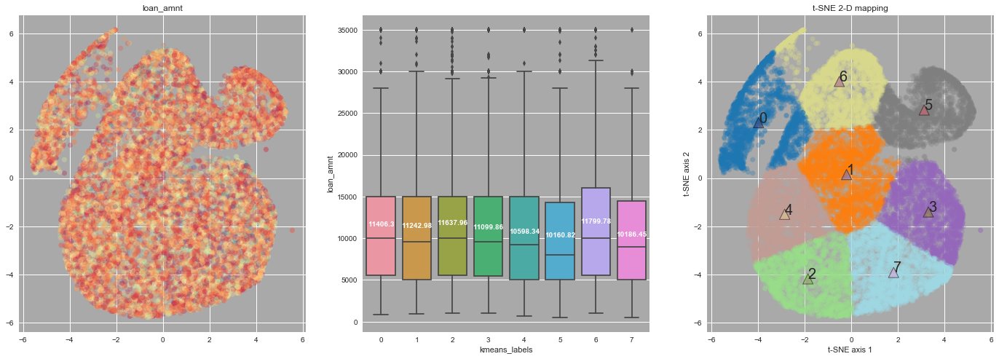

************************** annual_inc
****************************************


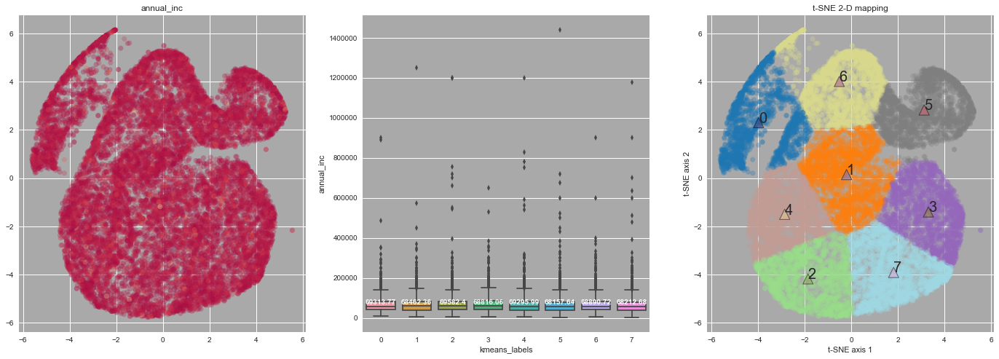

************************** dti
****************************************


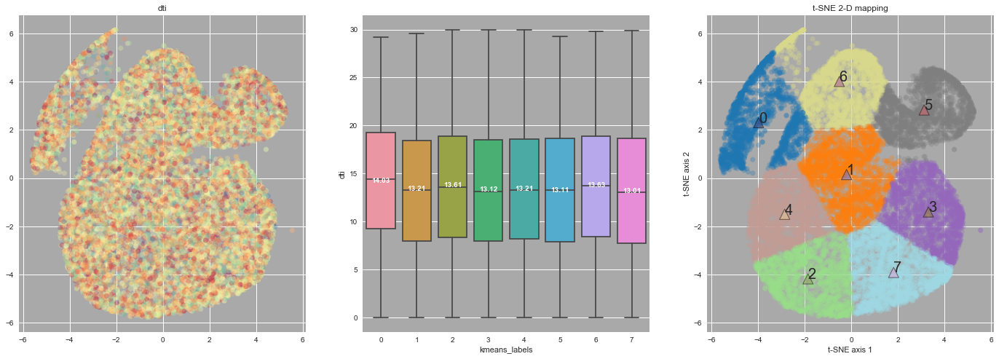

************************** delinq_2yrs
****************************************


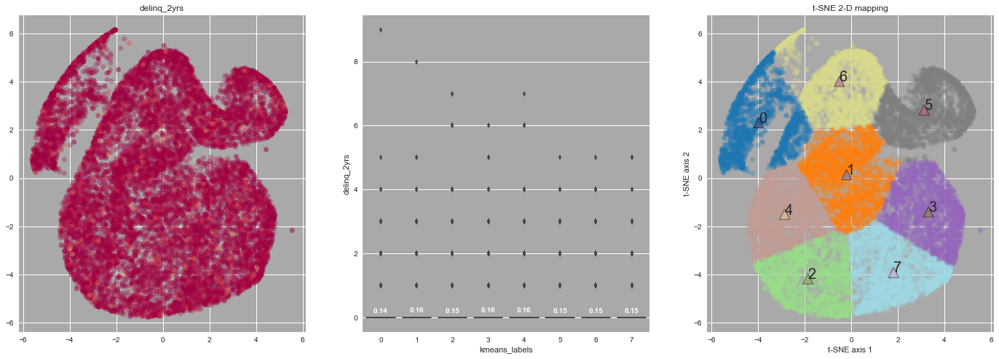

************************** inq_last_6mths
****************************************


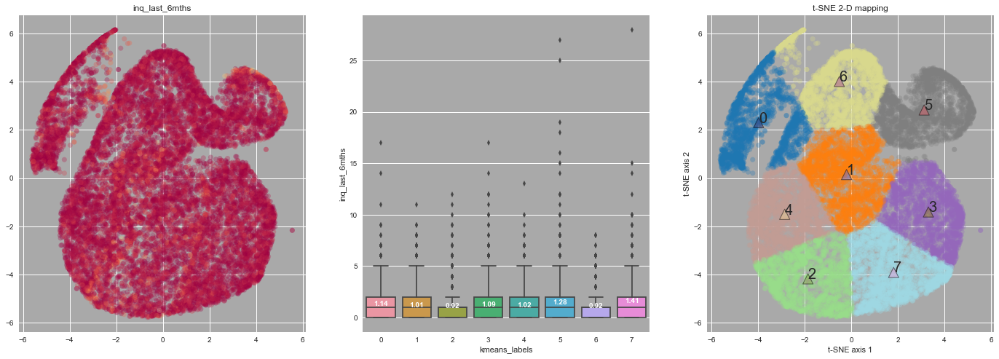

************************** mths_since_last_delinq
****************************************


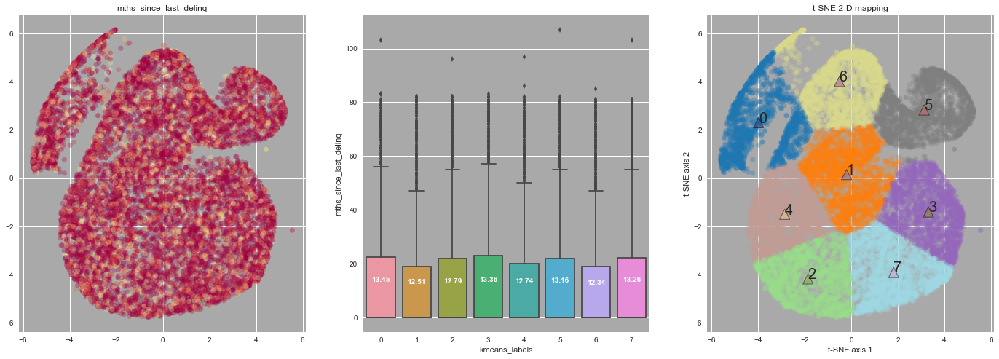

************************** mths_since_last_record
****************************************


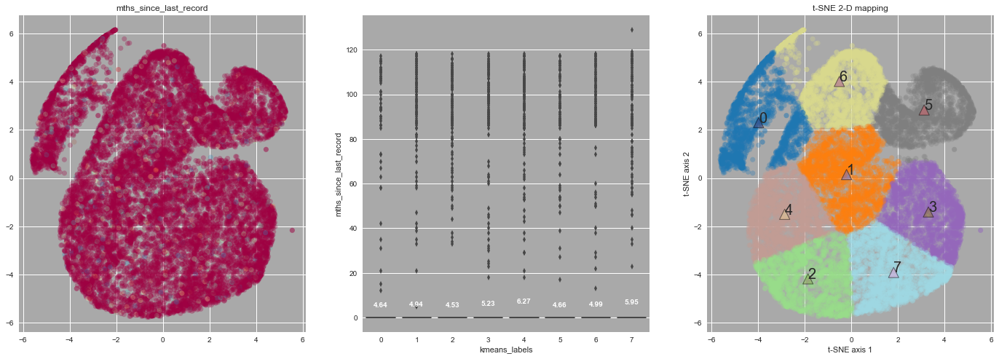

************************** open_acc
****************************************


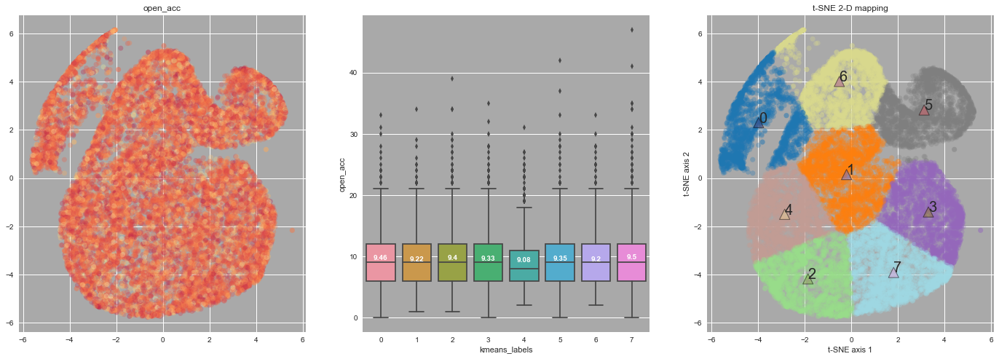

************************** pub_rec
****************************************


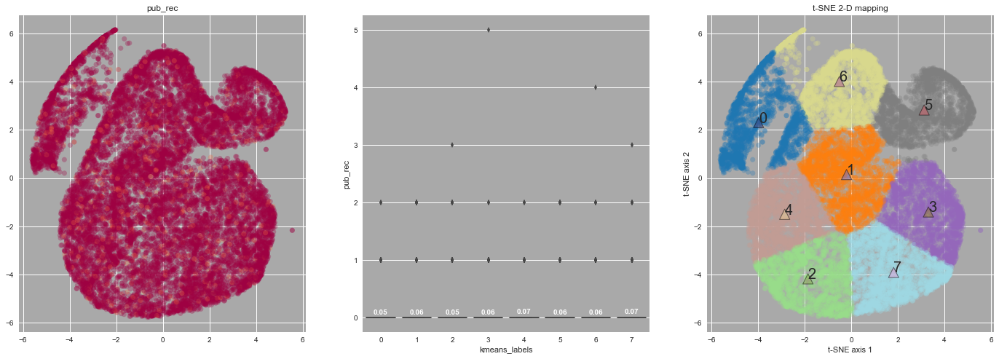

************************** revol_bal
****************************************


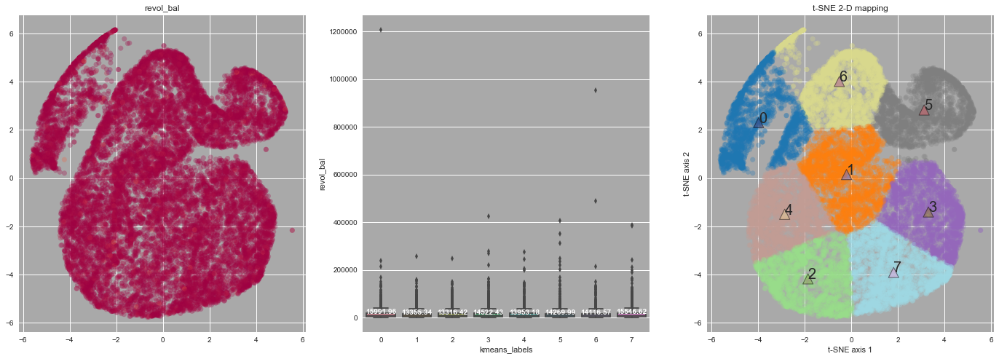

************************** revol_util
****************************************


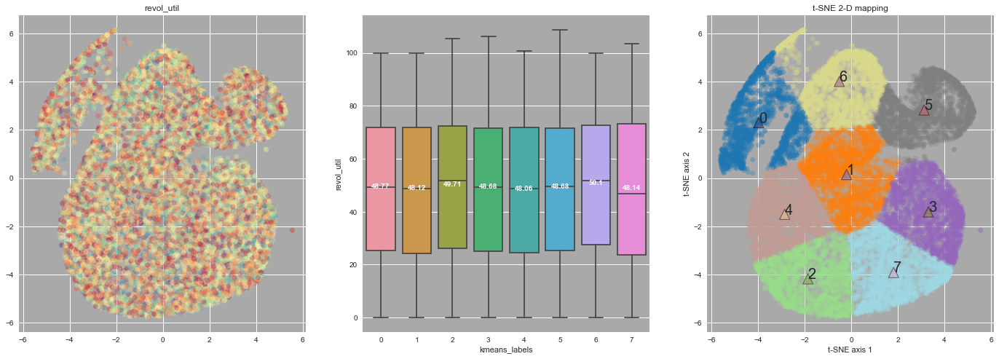

************************** total_acc
****************************************


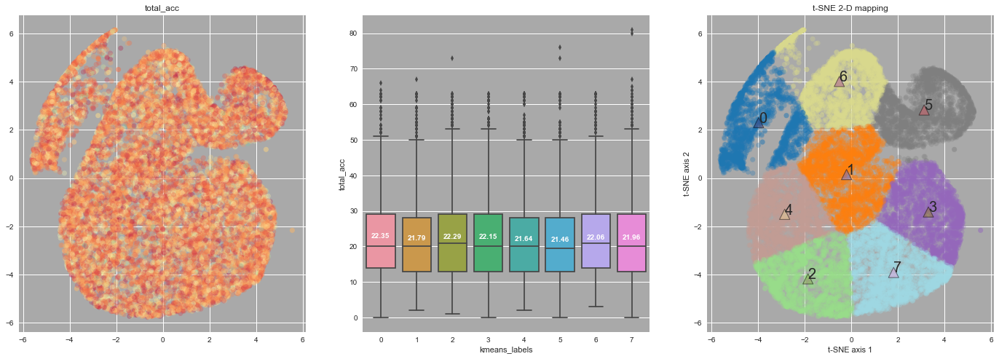

************************** pub_rec_bankruptcies
****************************************


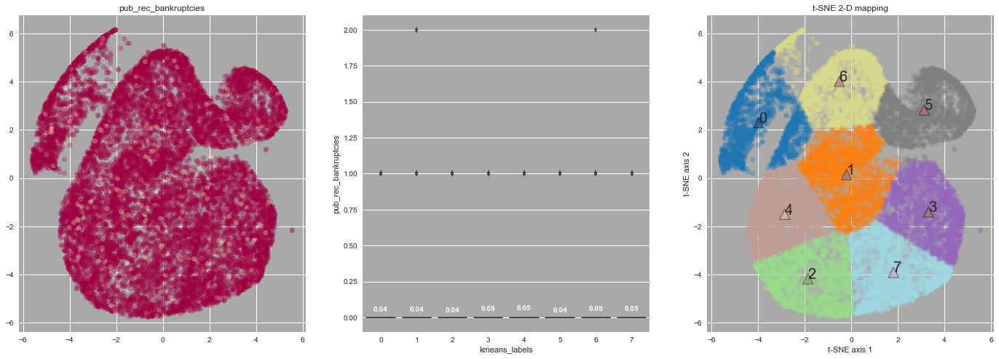

************************** n_term
****************************************


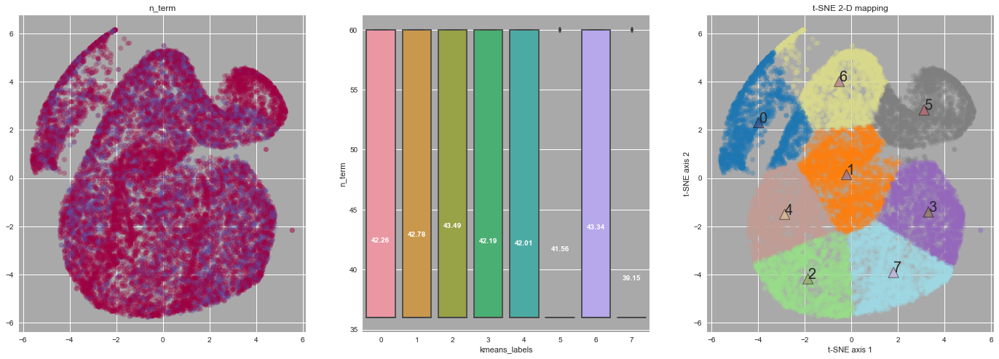

In [143]:

for col in col_to_convert_to_float :
    
    _ = plt.figure(figsize=(24, 8));
    print('**************************',col)
# ... feature distribution color map 

    _ = plt.subplot(131, facecolor = 'darkgrey');
    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'],
                 c = X_all_together[col],
                 cmap = plt.cm.Spectral,
                 s = 50,
                 linewidths = 0,
                 alpha = 0.30)
    _ = plt.title(col)
    
# ... feature boxplots

    _ = plt.subplot(132, facecolor = 'darkgrey');
    ax = sns.boxplot(x = "kmeans_labels", y = col, data = X_all_together);
    
    
    average_values = X_all_together.groupby(['kmeans_labels'])[col].mean().values
    average_labels = [str(np.round(s, 2)) for s in average_values]

 #   print("****************************************")
#    print(col)
  #  print(average_values)
  #  print(average_labels)
    raw_data = {
    'Column Name':col,
    'cluster 0':average_values[0],
    'cluster 1':average_values[1],
    'cluster 2':average_values[2],
    'cluster 3':average_values[3],
    'cluster 4':average_values[4],
    'cluster 5':average_values[5],
    'cluster 6':average_values[6],
    'cluster 7':average_values[7]
    }

    df_tbl = pd.DataFrame(raw_data,
    columns = ['Column Name','cluster 0','cluster 1','cluster 2','cluster 3','cluster 4','cluster 5','cluster 6','cluster 7'],
    index = [i_index + 1])
    kmeans_weight_tbl = kmeans_weight_tbl.append(df_tbl)    
    print("****************************************")
    pos = range(len(average_values))
    for tick, label in zip(pos, ax.get_xticklabels()):
        
        _ = ax.text(pos[tick], average_values[tick], average_labels[tick], 
                horizontalalignment = 'center', size = 'small', color = 'w', weight = 'semibold')

# ... cluster color map
    
    _ = plt.subplot(133, facecolor = 'darkgrey');
    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'],
                 c = kmeans_labels,
                 cmap = plt.cm.tab20,
                 s = 50,
                 linewidths = 0,
                 alpha = 0.30)
    _ = plt.scatter(kmeans_centers[:, 0], kmeans_centers[:, 1],
                c = range(n_lda),
                cmap = plt.cm.tab20b,
                s = 200,
                linewidths = 1.0,
                marker = '^',
                edgecolors = 'black',
                alpha = 0.50);    
    for ii in range(n_lda) :                                       
        _ = plt.text(kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii, fontsize = 20)
        
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2')
    _ = plt.title('t-SNE 2-D mapping')
    
    data_dir = 'C:/Users/Preeti/Github/CapstoneProject/unsupervised/plots/'
    data_file_base = "Kmeans_comparison_"
    data_file_num = str(col)
    #data_file_time = datetime.now().strftime("%Y%0m%0d_%H%M%S")
    data_file_time = '18.10.19'
    data_file_ext = ".png"
    plt_file_2_save = data_dir + data_file_base + data_file_num + data_file_time + data_file_ext
    
    plt.savefig(plt_file_2_save)
    _ = plt.show();

In [144]:
kmeans_weight_tbl.reset_index(inplace=True)
kmeans_weight_tbl

,index,Column Name,cluster 0,cluster 1,cluster 2,cluster 3,cluster 4,cluster 5,cluster 6,cluster 7
0,1,loan_amnt,11406.299911,11242.976374,11637.960251,11099.859551,10598.335893,10160.815912,11799.779412,10186.450382
1,1,annual_inc,69313.771455,68462.363641,69582.395326,68816.062458,69295.993712,68157.637131,68890.717422,68212.681039
2,1,dti,14.026122,13.211150,13.605707,13.121081,13.206636,13.106678,13.633260,13.011768
3,1,delinq_2yrs,0.144632,0.162815,0.154812,0.156367,0.159754,0.152149,0.147059,0.148219
4,1,inq_last_6mths,1.143744,1.007191,0.918410,1.091292,1.017921,1.283972,0.916667,1.410305
5,1,mths_since_last_delinq,13.451642,12.513097,12.793305,13.360955,12.735279,13.162021,12.336275,13.262087
6,1,mths_since_last_record,4.637977,4.940935,4.529289,5.225655,6.268817,4.658537,4.989706,5.953562
7,1,open_acc,9.463177,9.219312,9.396234,9.330524,9.081413,9.353078,9.203431,9.500000
8,1,pub_rec,0.053239,0.056497,0.052301,0.059925,0.069124,0.055168,0.056373,0.069338
9,1,revol_bal,15991.956522,13355.337442,13316.416736,14522.432116,13953.176651,14269.994774,14116.570098,15546.620865


In [145]:
#for row in kmeans_weight_tbl.iterrows():
sum = kmeans_weight_tbl['cluster 0'] + kmeans_weight_tbl['cluster 1']+ kmeans_weight_tbl['cluster 2'] + kmeans_weight_tbl['cluster 3'] + kmeans_weight_tbl['cluster 4']+ kmeans_weight_tbl['cluster 5']+ kmeans_weight_tbl['cluster 6']+ kmeans_weight_tbl['cluster 7']
kmeans_weight_tbl['Cluster #0'] = (kmeans_weight_tbl['cluster 0']/sum )  * 100
kmeans_weight_tbl['Cluster #1'] = (kmeans_weight_tbl['cluster 1']/sum )  * 100
kmeans_weight_tbl['Cluster #2'] =  (kmeans_weight_tbl['cluster 2']/sum )  * 100
kmeans_weight_tbl['Cluster #3'] = (kmeans_weight_tbl['cluster 3']/sum )  * 100
kmeans_weight_tbl['Cluster #4'] = (kmeans_weight_tbl['cluster 4']/sum )  * 100
kmeans_weight_tbl['Cluster #5'] = (kmeans_weight_tbl['cluster 5']/sum )  * 100
kmeans_weight_tbl['Cluster #6'] = (kmeans_weight_tbl['cluster 6']/sum )  * 100
kmeans_weight_tbl['Cluster #7'] = (kmeans_weight_tbl['cluster 7']/sum )  * 100
print(sum)

0      88132.477685
1     550731.622185
2        106.922404
3          1.225806
4          8.789502
5        103.614660
6         41.204478
7         74.547169
8          0.471966
9     115072.505204
10       390.250680
11       175.705004
12         0.353669
13       336.779162
dtype: float64


In [146]:
kmeans_weight_tbl

,index,Column Name,cluster 0,cluster 1,cluster 2,cluster 3,cluster 4,cluster 5,cluster 6,cluster 7,Cluster #0,Cluster #1,Cluster #2,Cluster #3,Cluster #4,Cluster #5,Cluster #6,Cluster #7
0,1,loan_amnt,11406.299911,11242.976374,11637.960251,11099.859551,10598.335893,10160.815912,11799.779412,10186.450382,12.942221,12.756905,13.205076,12.594517,12.025460,11.529026,13.388685,11.558112
1,1,annual_inc,69313.771455,68462.363641,69582.395326,68816.062458,69295.993712,68157.637131,68890.717422,68212.681039,12.585762,12.431166,12.634538,12.495390,12.582534,12.375835,12.508945,12.385830
2,1,dti,14.026122,13.211150,13.605707,13.121081,13.206636,13.106678,13.633260,13.011768,13.118039,12.355830,12.724842,12.271592,12.351608,12.258122,12.750611,12.169356
3,1,delinq_2yrs,0.144632,0.162815,0.154812,0.156367,0.159754,0.152149,0.147059,0.148219,11.798915,13.282251,12.629385,12.756267,13.032590,12.412136,11.996912,12.091544
4,1,inq_last_6mths,1.143744,1.007191,0.918410,1.091292,1.017921,1.283972,0.916667,1.410305,13.012619,11.459017,10.448942,12.415858,11.581101,14.608018,10.429108,16.045338
5,1,mths_since_last_delinq,13.451642,12.513097,12.793305,13.360955,12.735279,13.162021,12.336275,13.262087,12.982373,12.076570,12.347003,12.894850,12.291001,12.702856,11.905916,12.799431
6,1,mths_since_last_record,4.637977,4.940935,4.529289,5.225655,6.268817,4.658537,4.989706,5.953562,11.256002,11.991257,10.992224,12.682251,15.213922,11.305899,12.109620,14.448824
7,1,open_acc,9.463177,9.219312,9.396234,9.330524,9.081413,9.353078,9.203431,9.500000,12.694213,12.367085,12.604415,12.516269,12.182103,12.546523,12.345782,12.743609
8,1,pub_rec,0.053239,0.056497,0.052301,0.059925,0.069124,0.055168,0.056373,0.069338,11.280195,11.970602,11.081572,12.696909,14.646060,11.689064,11.944197,14.691402
9,1,revol_bal,15991.956522,13355.337442,13316.416736,14522.432116,13953.176651,14269.994774,14116.570098,15546.620865,13.897287,11.606020,11.572197,12.620245,12.125552,12.400873,12.267544,13.510283


In [147]:
kmeans_cols = ['Cluster #0', 'Cluster #1', 'Cluster #2', 'Cluster #3', 'Cluster #4', 'Cluster #5', 'Cluster #6', 'Cluster #7']
kmeans_cols

['Cluster #0',
 'Cluster #1',
 'Cluster #2',
 'Cluster #3',
 'Cluster #4',
 'Cluster #5',
 'Cluster #6',
 'Cluster #7']

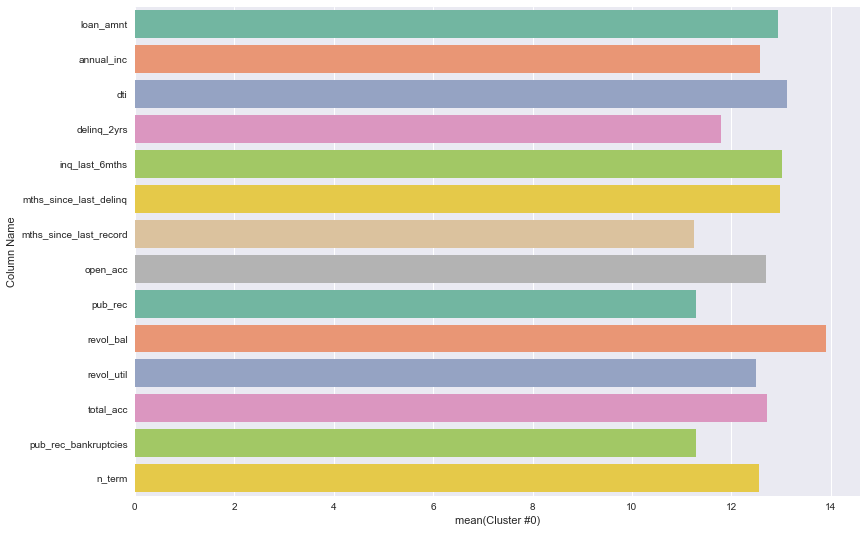

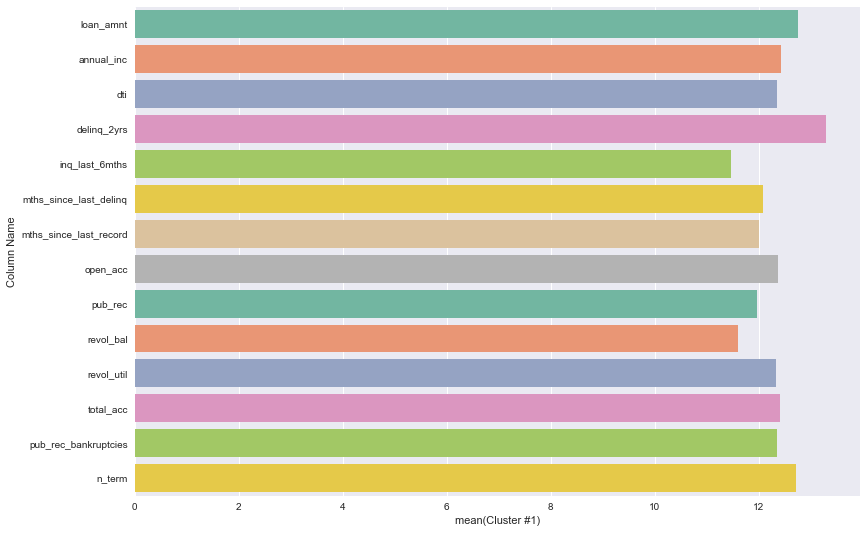

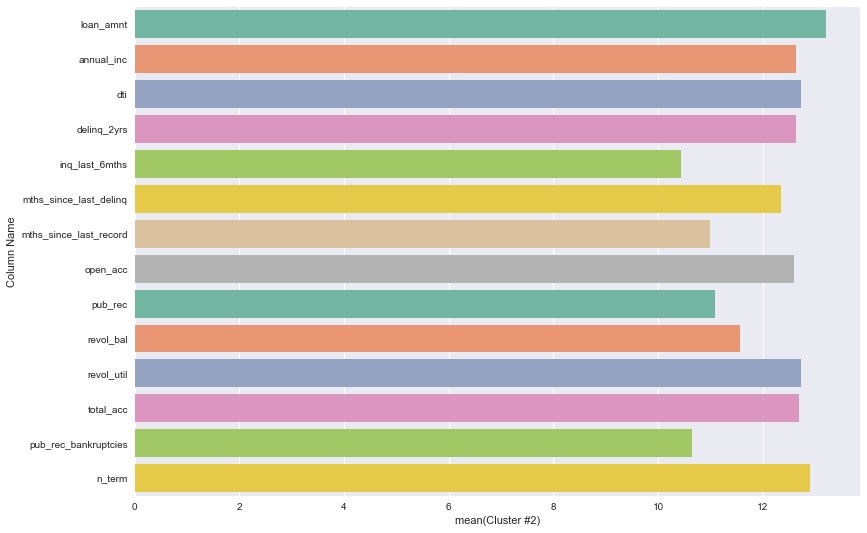

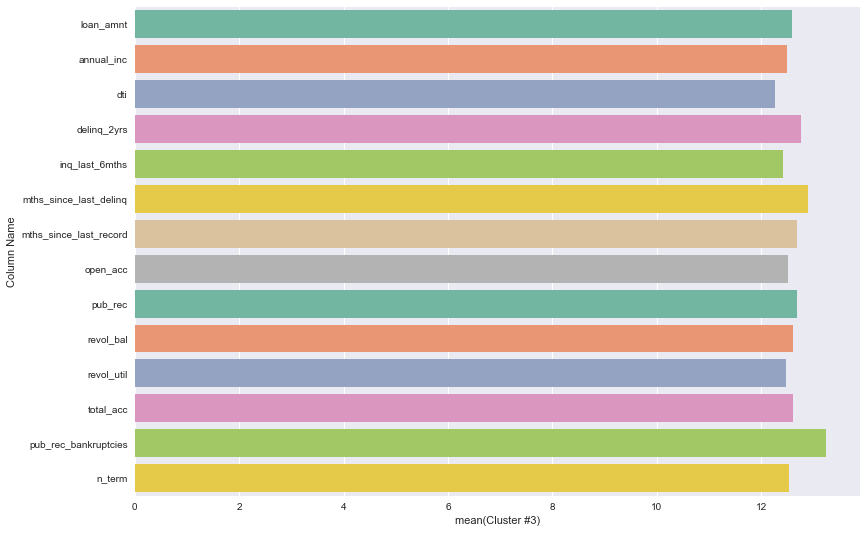

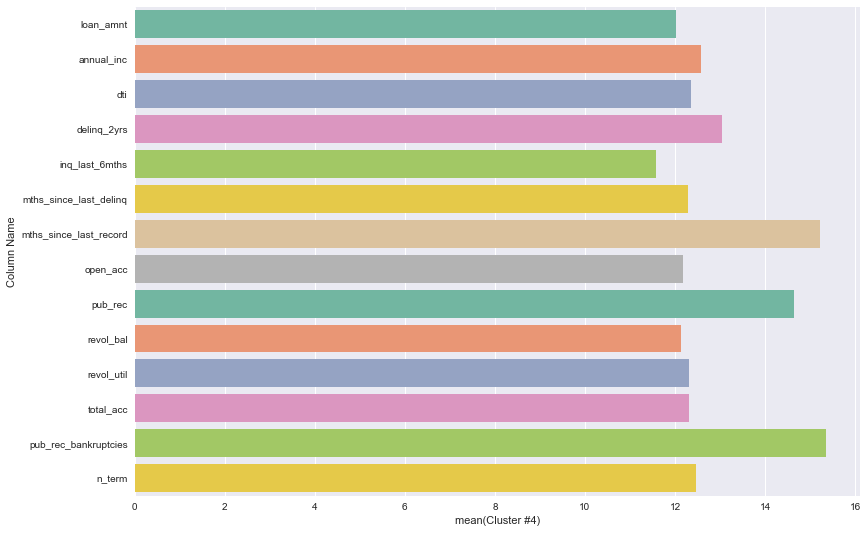

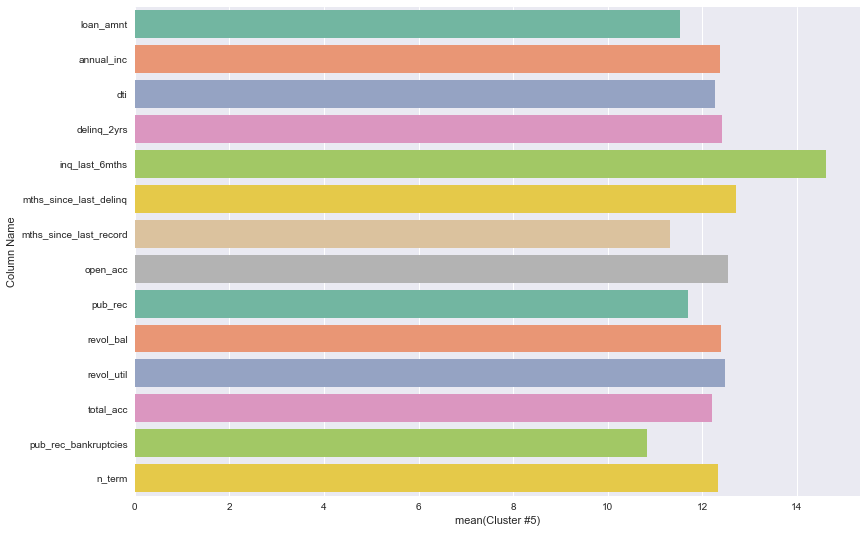

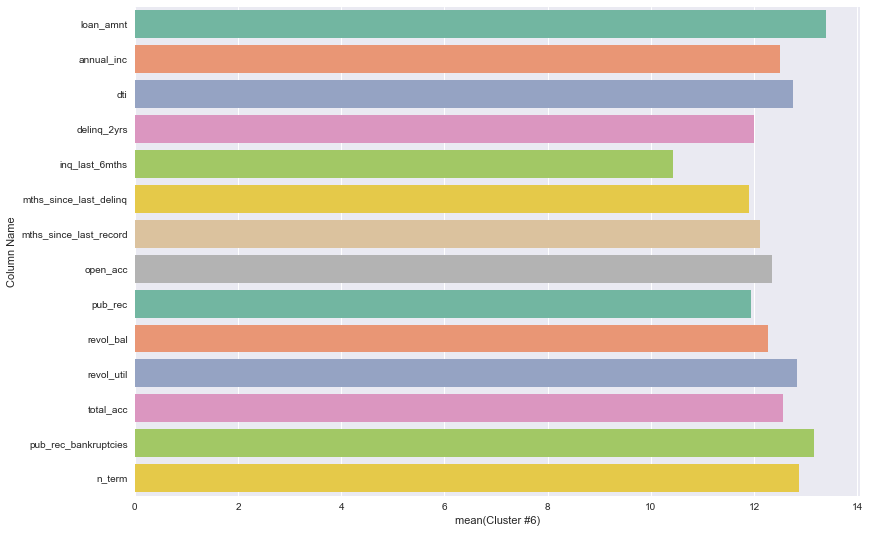

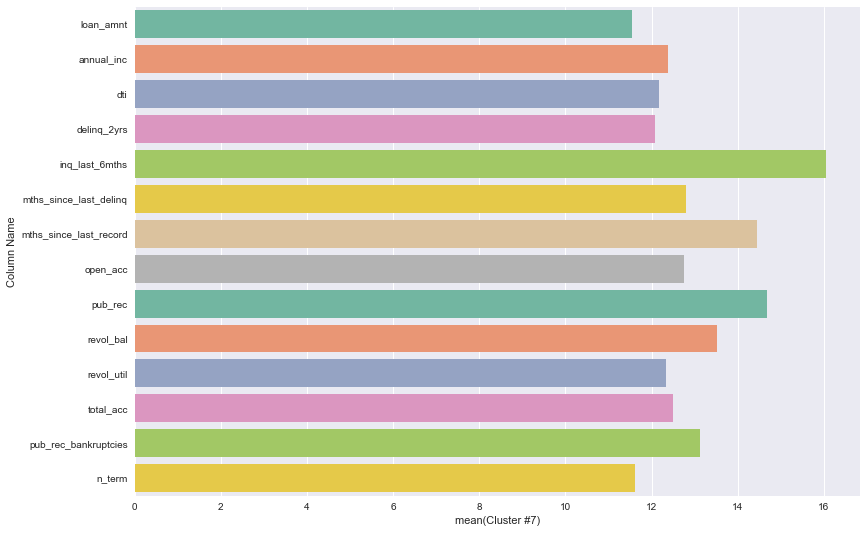

In [148]:
sns.set_style('whitegrid')
sns.set(rc={'figure.figsize':(13,9)})
for col in kmeans_cols:
    #sns.boxplot(y=col, x="index", data=kmeans_weight_tbl_plot,palette='rainbow')
    sns.barplot(y="Column Name", x=col, data=kmeans_weight_tbl,palette='Set2')
    #sns.barplot(x='sex',y='total_bill',data=tips)
    data_dir = 'C:/Users/Preeti/Github/CapstoneProject/unsupervised/plots/'
    data_file_base = "Kmeans_cluster_"
    data_file_num = str(col)
    #data_file_time = datetime.now().strftime("%Y%0m%0d_%H%M%S")
    data_file_time = '18.10.19'
    data_file_ext = ".png"
    plt_file_2_save = data_dir + data_file_base + data_file_num + data_file_time + data_file_ext
    plt.savefig(plt_file_2_save)
    plt.show()

### Hierachical Clustering

In [76]:
# set required variables for model comparison

comparison_tbl = pd.DataFrame(columns = [
    'model_name',
    'n_clusters',
    'inertia',
    'silhouette',
    'process_time'])

i_index = []
i_index = 0

# preparation for cross validation and model comparison, each classifier is appended once model is fit

models = []

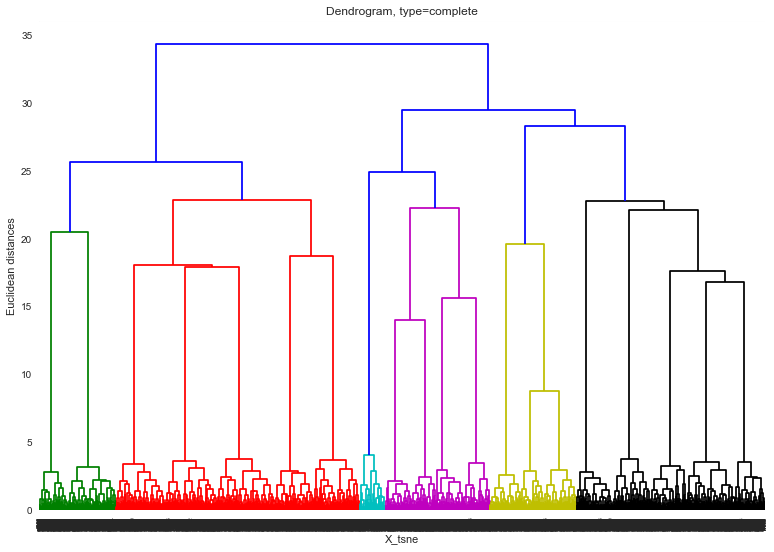

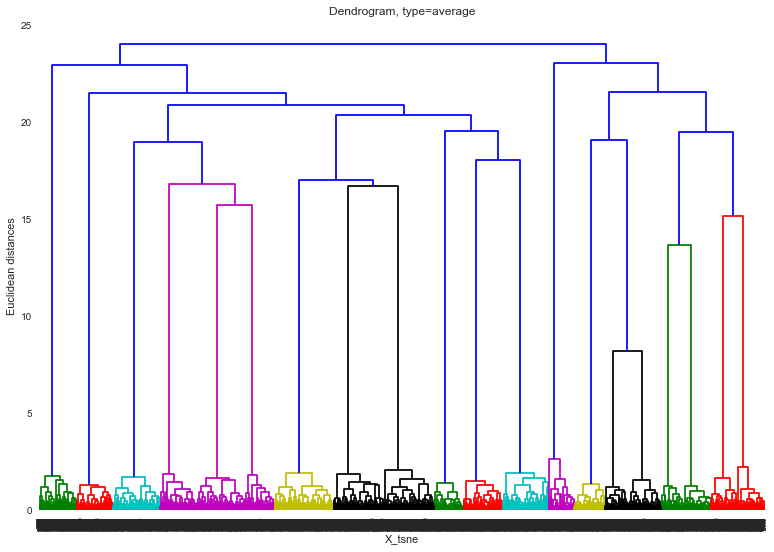

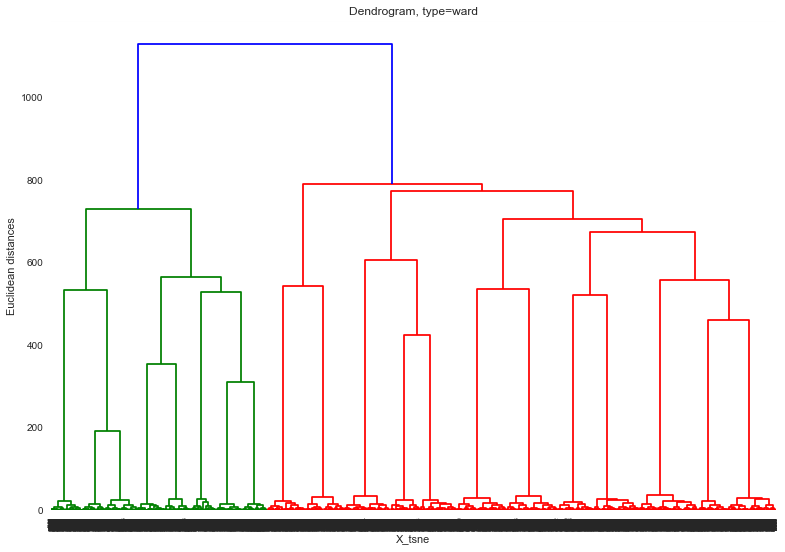

In [77]:
from scipy.cluster.hierarchy import dendrogram, linkage
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

# Using the dendrogram to find the optimal number of clusters
dendrogram = sch.dendrogram(sch.linkage(X_tsne, method = 'complete'))
_ = plt.title('Dendrogram, type=complete')
_ = plt.xlabel('X_tsne')
_ = plt.ylabel('Euclidean distances')
plt.savefig("C:/Users/Preeti/Github/CapstoneProject/unsupervised/plots/hierarchical/dendrogram_complete.png")
_ = plt.show()


# Using the dendrogram to find the optimal number of clusters
dendrogram = sch.dendrogram(sch.linkage(X_tsne, method = 'average'))
_ = plt.title('Dendrogram, type=average')
_ = plt.xlabel('X_tsne')
_ = plt.ylabel('Euclidean distances')
plt.savefig("C:/Users/Preeti/Github/CapstoneProject/unsupervised/plots/hierarchical/dendrogram_average.png")
_ = plt.show()


# Using the dendrogram to find the optimal number of clusters
dendrogram = sch.dendrogram(sch.linkage(X_tsne, method = 'ward'))
_ = plt.title('Dendrogram, type=ward')
_ = plt.xlabel('X_tsne')
_ = plt.ylabel('Euclidean distances')
plt.savefig("C:/Users/Preeti/Github/CapstoneProject/unsupervised/plots/hierarchical/dendrogram_ward.png")
_ = plt.show()

In [ ]:
n_optimal_cluster_ward = 3
n_optimal_cluster_average = 5
n_optimal_cluster_complete = 4

In [ ]:
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... optimal models for linkage = ward
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

tic = time.clock()
hc_ward = AgglomerativeClustering(n_clusters = n_optimal_cluster_ward, affinity = 'euclidean', linkage = 'ward')
hc_ward.fit(X_tsne)

hc_labels_ward = hc_ward.labels_ # the labels from hierarchical clustering
#hc_centers = hc_lda.cluster_centers_

# hc_inertia = hc_lda.inertia_
#print ("inertia = ", hc_inertia)

hc_silhouette = metrics.silhouette_score(X_tsne,
                                             hc_labels_ward,
                                             metric = 'euclidean',
                                             sample_size = 10000)
print ("silhouette = ", hc_silhouette)

toc =  time.clock()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - save statistics for model comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

exe_time = '{0:.4f}'.format(toc-tic)

raw_data = {
'model_name' : 'hierarchical - ward',
'n_clusters' : n_optimal_cluster_ward,
'inertia': 'NA',
'silhouette': hc_silhouette, 
'process_time' : exe_time
}

df_tbl = pd.DataFrame(raw_data,
columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
index = [i_index + 1])

comparison_tbl = comparison_tbl.append(df_tbl)

In [ ]:
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... optimal models for linkage = complete, #of clusters = 3
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

tic = time.clock()
hc_complete = AgglomerativeClustering(n_clusters = n_optimal_cluster_complete, affinity = 'euclidean', linkage = 'complete')
hc_complete.fit(X_tsne)

hc_labels_complete = hc_complete.labels_ # the labels from hierarchical clustering
#hc_centers = hc_lda.cluster_centers_

# hc_inertia = hc_lda.inertia_
#print ("inertia = ", hc_inertia)

hc_silhouette = metrics.silhouette_score(X_tsne,
                                             hc_labels_complete,
                                             metric = 'euclidean',
                                             sample_size = 10000)
print ("silhouette = ", hc_silhouette)

toc =  time.clock()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - save statistics for model comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

exe_time = '{0:.4f}'.format(toc-tic)

raw_data = {
'model_name' : 'hierarchical - complete',
'n_clusters' : n_optimal_cluster_complete,
'inertia': 'NA',
'silhouette': hc_silhouette, 
'process_time' : exe_time
}

df_tbl = pd.DataFrame(raw_data,
columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
index = [i_index + 1])

comparison_tbl = comparison_tbl.append(df_tbl)

In [ ]:
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... optimal models for linkage = average #of clusters = 4
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

tic = time.clock()
hc_average = AgglomerativeClustering(n_clusters = n_optimal_cluster_average, affinity = 'euclidean', linkage = 'average')
hc_average.fit(X_tsne)

hc_labels_average = hc_average.labels_ # the labels from hierarchical clustering
#hc_centers = hc_lda.cluster_centers_

# hc_inertia = hc_lda.inertia_
#print ("inertia = ", hc_inertia)

hc_silhouette = metrics.silhouette_score(X_tsne,
                                             hc_labels_average,
                                             metric = 'euclidean',
                                             sample_size = 10000)
print ("silhouette = ", hc_silhouette)

toc =  time.clock()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - save statistics for model comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

exe_time = '{0:.4f}'.format(toc-tic)

raw_data = {
'model_name' : 'hierarchical - average',
'n_clusters' : n_optimal_cluster_average,
'inertia': 'NA',
'silhouette': hc_silhouette, 
'process_time' : exe_time
}

df_tbl = pd.DataFrame(raw_data,
columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
index = [i_index + 1])

comparison_tbl = comparison_tbl.append(df_tbl)

In [ ]:
comparison_tbl = comparison_tbl.reset_index(drop=True)
comparison_tbl['process_time'] = pd.to_numeric(comparison_tbl['process_time'])
comparison_tbl

In [ ]:
sns.set_context('poster')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.25, 's' : 80, 'linewidths':0}


palette = sns.color_palette('deep', np.unique(hc_labels_ward).max() + 1)
colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in hc_labels_ward]
X_tsne_values = X_tsne.values;
_= plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1], c=colors, **plot_kwds)
frame = plt.gca()
frame.axes.get_xaxis().set_visible(False)
frame.axes.get_yaxis().set_visible(False)
_= plt.title('Hierarchical Clusters, type = ward ' , fontsize=16)
_ = plt.xlabel("X_tsne");
_ = plt.ylabel("y_tsne");
plt.savefig("C:/Users/Preeti/Github/CapstoneProject/unsupervised/plots/hierarchical/hc_ward_eval.png")
_=plt.show()

palette = sns.color_palette('deep', np.unique(hc_labels_average).max() + 1)
colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in hc_labels_average]
X_tsne_values = X_tsne.values;
_= plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1], c=colors, **plot_kwds)
frame = plt.gca()
frame.axes.get_xaxis().set_visible(False)
frame.axes.get_yaxis().set_visible(False)
_= plt.title('Hierarchical Clusters, type = average' , fontsize=16)
plt.savefig("C:/Users/Preeti/Github/CapstoneProject/unsupervised/plots/hierarchical/hc_average_eval.png")
_=plt.show()

palette = sns.color_palette('deep', np.unique(hc_labels_complete).max() + 1)
colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in hc_labels_complete]
X_tsne_values = X_tsne.values;
_= plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1], c=colors, **plot_kwds)
frame = plt.gca()
frame.axes.get_xaxis().set_visible(False)
frame.axes.get_yaxis().set_visible(False)
_= plt.title('Hierarchical Clusters, type = complete' , fontsize=16)
plt.savefig("C:/Users/Preeti/Github/CapstoneProject/unsupervised/plots/hierarchical/hc_complete_eval.png")
_=plt.show()


In [ ]:
X_all_together['hierarchical'] = hc_labels_average

In [ ]:
hc_labels_average

In [ ]:
hc_average_centers_x = X_all_together.groupby(['hierarchical'])['x-tsne'].mean()
hc_average_centers_y= X_all_together.groupby(['hierarchical'])['y-tsne'].mean()
hc_average_centers_x
hc_average_centers_y
n_lda = np.unique(hc_labels_average).max() +1
n_lda

#### feature importance for complete method

X_HC_average_analysis = copy.deepcopy(X_all_together)
del X_HC_average_analysis['x-tsne']
del X_HC_average_analysis['y-tsne']
#del X_HC_average_analysis['sample_index']

grouped = X_HC_average_analysis.groupby(['hierarchical'])
#print(grouped)

X_HC_average_analysis = (grouped.mean() - X_HC_average_analysis.mean()) / X_HC_average_analysis.std()

#HC_Complete_analysis_tbl

In [ ]:
# boxplot across clusters for each feature ...
import seaborn as sns
sns.set_palette("husl")
plt.style.use('classic')

col_names = X_all_together.columns.values.tolist()

for col in col_names :
    
    print("************************* ",col)
    _ = plt.figure(figsize=(24, 8));
    
# ... feature distribution color map 

    _ = plt.subplot(131, facecolor = 'darkgrey');
    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'],
                 c = X_all_together[col],
                 cmap = plt.cm.Spectral,
                 s = 50,
                 linewidths = 0,
                 alpha = 0.30)
    _ = plt.title(col)
    
# ... feature boxplots

    _ = plt.subplot(132, facecolor = 'darkgrey');
    ax = sns.boxplot(x = "hierarchical", y = col, data = X_all_together);
    #sns.axlabel(xlabel="hc_labels_complete");
    _ = plt.xlabel("hc_labels_average");
    _ = plt.title(col)
    
    average_values = X_all_together.groupby(['hierarchical'])[col].mean().values
    average_labels = [str(np.round(s, 2)) for s in average_values]

    pos = range(len(average_values))
    for tick, label in zip(pos, ax.get_xticklabels()):
        
        _ = ax.text(pos[tick], average_values[tick], average_labels[tick], 
                horizontalalignment = 'center', size = 'small', color = 'w', weight = 'semibold')

# ... cluster color map
    
    _ = plt.subplot(133, facecolor = 'darkgrey');
    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'],
                 c = hc_labels_average,
                 cmap = plt.cm.tab20,
                 s = 50,
                 linewidths = 0,
                 alpha = 0.30)
    for ii in range(n_lda) :                                       
           _ = plt.text(hc_average_centers_x[ii], hc_average_centers_y[ii], ii, fontsize = 20)
        
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2')
    _ = plt.title('t-SNE 2-D mapping')
    _ = plt.title(col)
    plt.savefig("C:/Users/Preeti/Github/CapstoneProject/unsupervised/plots/hierarchical/HC_average_%s.png" %col)
    _ = plt.show();